In [191]:
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [192]:
%whos

Variable                              Type                          Data/Info
-----------------------------------------------------------------------------
Adam                                  type                          <class 'torch.optim.adam.Adam'>
AttentionLayer                        type                          <class 'zebraFormer.AttentionLayer'>
DEVICE                                device                        cuda
DSW_embedding                         type                          <class 'zebraFormer.DSW_embedding'>
DataLoader                            type                          <class 'torch.utils.data.dataloader.DataLoader'>
Decoder                               type                          <class 'zebraFormer.Decoder'>
DecoderLayer                          type                          <class 'zebraFormer.DecoderLayer'>
EdgeConv                              type                          <class 'torch_geometric.n<...>conv.edge_conv.EdgeConv'>
Encoder             

tensor(0.9331, device='cuda:0')
loss_func                             Loss                          Loss(\n  (criterion): HuberLoss()\n)
mat_data                              dict                          n=12
mat_file_path                         str                           /cluster/home/abasine/mas<...>atasetNeurons/for_rst.mat
math                                  module                        <module 'math' from '/clu<...>-39-x86_64-linux-gnu.so'>
metrics_df                            DataFrame                          Correlation       MS<...>n\n[221 rows x 2 columns]
model                                 GDN_Dynamic                   GDN_Dynamic(\n  (enc_valu<...>2, inplace=False)\n  )\n)
moving_average                        function                      <function moving_average at 0x14e58b832820>
mse_per_series                        ndarray                       1x221: 221 elems, type `float32`, 884 bytes
nll_gaussian                          function                      <f

In [193]:
import torch_geometric
import torch
print(torch.__version__)
print(torch_geometric.__version__)
print(torch.version.cuda)

import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torch.optim import Adam

import pandas as pd
from tqdm import tqdm

import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim
from sklearn.preprocessing import MinMaxScaler,RobustScaler, StandardScaler

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


from util.utils import *
from sklearn.preprocessing import MinMaxScaler,RobustScaler, StandardScaler

from util.dataset import TimeDataset, TimeDatasetFull

2.4.1+cu121
2.6.0
12.1


In [194]:
# Set seed for NumPy
np.random.seed(42)

# Set seed for PyTorch (both CPU and GPU - CUDA)
torch.manual_seed(42)

# If you are using CUDA, set the seed for CUDA as well
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
    torch.cuda.manual_seed_all(42)  # If using multi-GPU

# Make the behavior deterministic (optional, but may slow down computation)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [195]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.cuda.empty_cache()

## Load Data

In [196]:
PATH = "/cluster/home/abasine/masteroppgavee/TFE4940/model/GDN/data/DatasetNeurons/newData_2.csv"


df_mts = pd.read_csv(PATH)


from scipy.io import loadmat

# Load the .mat file
mat_file_path = '/cluster/home/abasine/masteroppgavee/TFE4940/model/GDN/data/DatasetNeurons/for_rst.mat'
mat_data = loadmat(mat_file_path)
df_mts = pd.DataFrame(mat_data['dff_new_s1'].T)
df_mts_2 = pd.DataFrame(mat_data['dff_new_s2'].T)

#df_mts = df_mts.iloc[:, :28]
df_mts = df_mts[:-56]
df_mts_2 = df_mts_2[:-56]

In [197]:
result = pd.concat([df_mts, df_mts_2], axis=1)
#df_mts = result

In [198]:
df_mts

,0,1,2,3,4,5,6,7,8,9,...,211,212,213,214,215,216,217,218,219,220
0,4.591109,0.372380,-2.508459,-1.338311,1.551461,-16.182619,-3.124105,7.677528,-5.505032,-7.052591,...,-13.763283,34.484558,-24.480438,15.121701,39.547157,9.630797,4.785846,-14.328345,-18.173271,-32.007008
1,0.280329,-8.264450,1.844108,3.043221,17.981138,5.506310,2.678090,-0.682472,7.715602,5.349689,...,-23.797836,-15.798852,9.436405,-8.278419,-8.252527,-12.612213,-10.982370,9.258155,5.088160,26.428812
2,-3.829585,6.395435,-0.593174,-0.742654,-16.039207,13.032767,-0.065837,-5.111877,1.526925,1.338943,...,31.432163,-18.851068,17.374390,-2.423989,-28.075743,4.212810,5.106184,13.206841,2.277408,0.694608
3,3.724619,4.634641,8.701281,1.633216,-7.442135,-6.132847,2.993351,-3.482356,-14.583933,-0.862902,...,9.217818,15.901976,-6.795521,-9.595957,-3.941340,-5.682829,20.674095,-18.112131,21.764523,5.094238
4,-15.770891,0.139789,-10.157866,-11.694777,-13.701073,-4.403834,-3.301757,-5.174725,4.890420,5.292485,...,7.209745,-31.221714,-3.129211,-9.553830,-16.994865,5.499537,-41.821049,-23.296692,23.948542,16.400385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,-36.835915,-1.611850,-20.403879,-24.174641,9.061345,-55.226475,-9.702937,-10.740920,4.661289,12.329502,...,3.624535,13.523067,-16.521284,-12.963737,-11.916198,17.031603,10.643623,-20.122337,-16.884344,-13.981640
7996,-26.326223,-0.700868,-18.295805,-14.419122,-13.052411,-51.115345,0.141048,-6.835659,3.526078,12.770222,...,-2.705390,22.058397,3.566564,2.149258,-9.789415,-5.528348,42.457508,-18.118504,8.500721,-11.066630
7997,-29.045338,-2.473762,-19.890648,-21.810259,3.565115,-46.171715,-15.220213,-14.909266,3.954346,8.740287,...,-12.107329,54.557377,7.954933,-34.962170,-16.653728,-13.655763,-20.032385,42.285023,22.688305,-8.262823
7998,-24.434643,-1.216818,-8.091356,-16.525173,-15.349420,-33.423599,-9.604365,-9.679831,5.708244,4.568586,...,-8.652620,47.958344,-1.087185,-26.540148,-2.852640,23.932098,-22.137877,23.552340,-24.535618,0.817230


In [199]:
import numpy as np
import pandas as pd
from scipy.signal import butter, filtfilt

def apply_butterworth_bandpass_filter(df, column_names, lowcut, highcut, fs, order=5):
    # Design the Butterworth bandpass filter
    nyq = 0.5 * fs  # Nyquist Frequency
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')

    # Apply the filter to each specified column in the DataFrame
    for column in column_names:
        df[column] = filtfilt(b, a, df[column].values)
    
    return df

In [200]:
mat_data['positions_s1'].shape

(221, 5)

In [201]:
df_mts_pos = pd.DataFrame(mat_data['positions_s1'][:, :3], columns=['x', 'y', 'z'])

In [202]:
df_mts_pos

,x,y,z
0,1374.78188,1602.621580,8.897763
1,1177.29940,1784.910290,9.909831
2,1222.87228,1784.910290,9.909831
3,1253.25420,1754.528839,9.741153
4,1420.35476,1648.193758,9.150780
...,...,...,...
216,1348.19770,1488.691136,45.585220
217,1314.01804,1750.731157,47.040068
218,1283.63612,1644.396076,46.449695
219,1029.18754,1860.863920,47.651525


## Preprocess

### Create Edge Index

Creting Edge index is not used anymore. I used this to define a fully connected initial graph for the model 

### Correaltion Matrix

In [203]:
from sklearn.preprocessing import MinMaxScaler,RobustScaler, StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_mts)

scaled_df = pd.DataFrame(scaled_data, columns=df_mts.columns)

correlation_matrix = scaled_df.corr()

In [204]:
scaled_df

,0,1,2,3,4,5,6,7,8,9,...,211,212,213,214,215,216,217,218,219,220
0,0.090610,-0.003253,-0.106210,-0.077005,0.012274,-0.305557,-0.123777,0.312048,-0.217421,-0.210809,...,-0.459106,1.011513,-0.814702,0.367884,1.433444,0.307740,0.178698,-0.460359,-0.780308,-1.153240
1,-0.037055,-0.380048,0.003432,0.030727,0.532117,0.007236,-0.034882,-0.056247,0.224935,0.046167,...,-0.778299,-0.494989,0.278299,-0.232211,-0.311870,-0.443166,-0.426556,0.253753,0.200263,0.911813
2,-0.158770,0.259513,-0.057963,-0.062359,-0.544303,0.115781,-0.076922,-0.251382,0.017865,-0.036936,...,0.978533,-0.586434,0.534108,-0.082074,-1.035677,0.124833,0.190995,0.373305,0.081778,0.002397
3,0.064948,0.182696,0.176165,-0.003942,-0.272287,-0.160621,-0.030052,-0.179594,-0.521196,-0.082558,...,0.271908,0.454775,-0.244789,-0.265999,-0.154455,-0.209236,0.788560,-0.574918,0.903245,0.157874
4,-0.512414,-0.013400,-0.298899,-0.331647,-0.470323,-0.135686,-0.126499,-0.254150,0.130406,0.044981,...,0.208033,-0.957062,-0.126639,-0.264919,-0.631080,0.168272,-1.610282,-0.731888,0.995311,0.557420
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,-1.136257,-0.089818,-0.556998,-0.638498,0.249891,-0.868640,-0.224571,-0.499366,0.122739,0.190788,...,0.093989,0.383502,-0.558211,-0.352366,-0.445642,0.557585,0.403546,-0.635780,-0.725975,-0.516245
7996,-0.825011,-0.050075,-0.503895,-0.398632,-0.449799,-0.809350,-0.073752,-0.327322,0.084755,0.199920,...,-0.107362,0.639223,0.089138,0.035206,-0.367986,-0.204021,1.624705,-0.575111,0.344118,-0.413232
7997,-0.905538,-0.127420,-0.544069,-0.580364,0.075987,-0.738054,-0.309101,-0.683000,0.099085,0.116420,...,-0.406431,1.612900,0.230558,-0.916515,-0.618624,-0.478396,-0.773936,1.253685,0.942187,-0.314148
7998,-0.768992,-0.072584,-0.246844,-0.450415,-0.522477,-0.554203,-0.223061,-0.452620,0.157770,0.029982,...,-0.296539,1.415191,-0.060833,-0.700532,-0.114703,0.790540,-0.854754,0.686528,-1.048509,0.006730


### Init split

In [205]:
split_sizes = [
    (2000, 1000),
    (3000, 1000),
    (4000, 1000),
    (5000, 1000),
    (6000, 1000),
    (7000, 1000),
]


splits = []
for train_size, test_size in split_sizes:
    train_set = df_mts.iloc[:train_size]
    test_set = df_mts.iloc[train_size:train_size + test_size]
    splits.append((train_set, test_set))

# Display the results
for i, (train, test) in enumerate(splits, 1):
    print(f"Split {i}:")
    print(f"Training set: {len(train)} rows")
    print(f"Test set: {len(test)} rows")
    print("\n")

Split 1:
Training set: 2000 rows
Test set: 1000 rows


Split 2:
Training set: 3000 rows
Test set: 1000 rows


Split 3:
Training set: 4000 rows
Test set: 1000 rows


Split 4:
Training set: 5000 rows
Test set: 1000 rows


Split 5:
Training set: 6000 rows
Test set: 1000 rows


Split 6:
Training set: 7000 rows
Test set: 1000 rows




In [206]:
splits[0][1]

,0,1,2,3,4,5,6,7,8,9,...,211,212,213,214,215,216,217,218,219,220
2000,7.907269,-18.147654,28.108007,23.909655,-15.645888,143.367233,-33.340260,17.651344,4.465853,17.280193,...,26.383987,18.093611,3.021145,12.380827,-4.751443,33.376999,-36.658157,23.077440,-3.222721,39.645714
2001,15.175964,-15.563330,2.437528,23.983324,-19.617435,137.169464,-32.365356,23.804935,21.402050,8.518748,...,19.961210,29.817551,-8.008407,-25.976694,-3.005868,-11.794162,-20.824406,18.020422,3.538961,19.200056
2002,4.062612,-11.697815,32.215710,14.496049,-26.277866,118.601730,-29.704252,9.076164,27.617668,0.548678,...,-12.129930,7.149829,6.661145,70.465317,-21.649052,-11.573061,69.679993,3.970030,13.793522,12.130117
2003,4.093824,-25.849247,11.612938,19.498482,-1.999210,107.024170,-30.873268,23.431856,22.688223,8.082781,...,-0.429062,12.322251,-7.993541,7.952234,-12.973624,-18.020361,-37.822533,15.503754,-10.598908,-0.977706
2004,9.821086,-14.930457,37.123291,13.259736,-27.257792,93.372292,-17.482653,23.842823,35.263260,21.261681,...,-18.943098,11.396767,31.218082,18.814295,-12.703104,16.300028,4.445958,-1.488450,-20.147520,18.892473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,1.021538,-15.255292,-33.985790,60.557068,-10.148493,4.268822,14.643449,25.443020,-8.527870,-40.979206,...,-43.865383,-34.451851,-31.917465,-32.632549,-34.737511,9.489847,-34.045265,-54.630695,-17.399506,-36.580883
2996,2.606135,-6.850956,-35.166786,44.449356,14.640729,-16.262222,21.138786,21.744242,5.672376,-43.370987,...,-38.297028,-27.594856,-34.165966,13.816998,-27.393940,-37.908867,-15.874577,-18.968763,-20.904823,-19.651617
2997,9.320913,-17.100893,-21.494215,44.925362,-8.986862,-14.655603,26.472633,32.082741,8.525306,-36.154263,...,0.668054,-8.054509,-31.385889,-14.908036,-12.552757,-10.267757,-5.403957,-17.429169,-12.216488,-3.337780
2998,-9.869124,3.921451,-30.635977,42.200352,5.955725,5.488548,17.475327,38.724949,3.934859,-27.449394,...,3.344912,1.682606,-35.841221,-5.071529,-2.179808,-0.886015,27.833647,-24.171831,6.114709,-11.276783


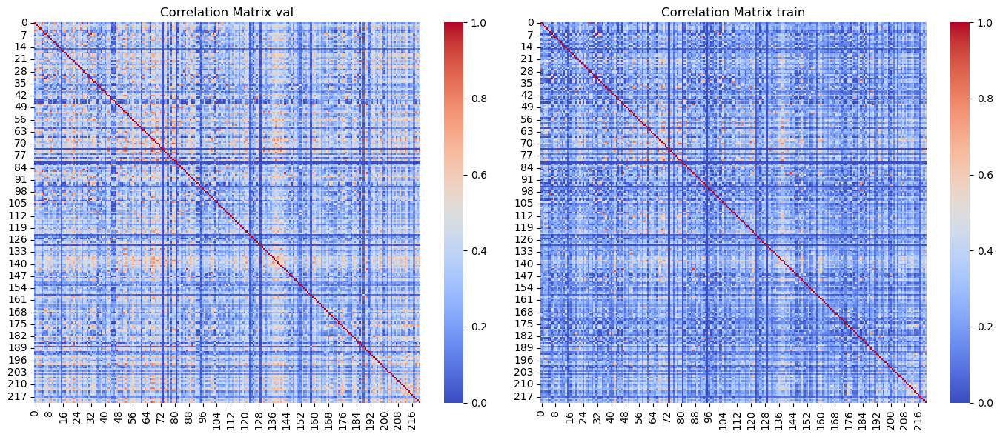

In [207]:
correlation_matrix_val= splits[-1][1].corr()
correlation_matrix_train = splits[-1][0].corr()

# Set up a figure with two subplots side by side
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Plot the first heatmap on the left
sns.heatmap(correlation_matrix_val.values, cmap="coolwarm", annot=False, cbar=True, vmax=1, vmin=0, ax=ax[0])
ax[0].set_title("Correlation Matrix val")

# Plot the second heatmap on the right
sns.heatmap(correlation_matrix_train.values, cmap="coolwarm", annot=False, cbar=True, vmax=1, vmin=0, ax=ax[1])
ax[1].set_title("Correlation Matrix train")

# Adjust layout for a cleaner look
plt.tight_layout()
plt.show()

In [208]:
from sklearn.preprocessing import MinMaxScaler,RobustScaler, StandardScaler,Normalizer, QuantileTransformer
"""
#scaler = MinMaxScaler(feature_range=(-1,5))
scaler = StandardScaler()
dataset_train = TimeDataset(raw_data=train_df,df_mts_spike=spike_train_df, edge_index=None, scale=True, win=[200, 50], out_pred=200,scaler = scaler)
dataset_val = TimeDataset(raw_data=validation_df,df_mts_spike = spike_validation_df, edge_index=None, scale=True, win=[200, 50], out_pred=200,  val_data=True, scaler = scaler)
"""
train_datasets = []
val_datasets = []
scalers = []

for i, (train_df, validation_df) in enumerate(splits, 1):
    # Initialize a new scaler for each split
    scaler = RobustScaler()  
    # Fit the scaler on the training data for this split
    scalar = scaler.fit(train_df)

    dataset_train = TimeDataset(
        raw_data=train_df,
        df_mts_spike=None,
        edge_index=None,
        scale=True,
        win=[200, 50],
        out_pred=50,
        scaler=scaler  # Pass the split-specific scaler
    )
    train_datasets.append(dataset_train)

    
    dataset_val = TimeDataset(
        raw_data=validation_df,
        df_mts_spike=None,
        edge_index=None,
        scale=True,
        win=[200, 50],
        out_pred=50,
        val_data=True,
        scaler=scaler  # Use the same scaler as the training data
    )
    val_datasets.append(dataset_val)
    scalers.append(scaler)

    print(f"Processed datasets for Split {i}:")
    print(f"Training dataset: {len(dataset_train)} samples")
    print(f"Validation dataset: {len(dataset_val)} samples")
    print("\n")


Processed datasets for Split 1:
Training dataset: 36 samples
Validation dataset: 16 samples


Processed datasets for Split 2:
Training dataset: 56 samples
Validation dataset: 16 samples


Processed datasets for Split 3:
Training dataset: 76 samples
Validation dataset: 16 samples


Processed datasets for Split 4:
Training dataset: 96 samples
Validation dataset: 16 samples




Processed datasets for Split 5:
Training dataset: 116 samples
Validation dataset: 16 samples


Processed datasets for Split 6:
Training dataset: 136 samples
Validation dataset: 16 samples




In [209]:
dataset_train.__len__()

136

In [210]:
dataset_train.__getitem__(0)

(tensor([[ 3.2761e-01,  1.6129e-01,  2.7163e-03,  ...,  1.0983e+00,
           1.4925e+00,  1.2147e+00],
         [ 1.5175e-01, -2.2302e-01,  4.1310e-01,  ...,  3.6390e-01,
           5.7185e-02,  4.1099e-02],
         [ 8.9460e-02,  2.1777e-01,  1.4592e-01,  ...,  2.4444e+00,
           2.8140e+00,  2.9278e+00],
         ...,
         [-2.3794e-01,  3.4757e-01,  4.4559e-01,  ...,  1.5678e-01,
           5.0068e-02,  7.6702e-01],
         [-5.8855e-01,  3.1233e-01,  2.0347e-01,  ...,  1.7235e-01,
           2.5294e-01, -9.5661e-02],
         [-8.4457e-01,  8.6797e-01,  1.1380e-01,  ..., -1.2871e-02,
           3.8213e-01,  4.2079e-01]], dtype=torch.float64),
 tensor([[ 1.1277,  1.3671,  1.2026,  ..., -0.6150, -0.7885, -0.5162],
         [ 0.7488,  0.9045,  0.3388,  ..., -0.2693, -0.7941,  0.1567],
         [ 2.5041,  2.5955,  2.2531,  ..., -1.1190, -1.0901, -0.9442],
         ...,
         [ 0.3817,  0.6598,  0.4059,  ..., -0.7378, -0.5378, -0.7057],
         [ 0.3864,  0.4879,  0.9471

In [211]:
dataset_val.__getitem__(0)

(tensor([[-4.9301e-01,  6.5041e-01,  5.9970e-01,  ...,  2.2138e+00,
           1.5045e+00,  1.5506e+00],
         [ 1.2489e+00,  4.5897e-01,  2.3462e-01,  ...,  1.6935e+00,
           1.6718e+00,  1.2146e+00],
         [ 6.8147e-01,  8.6872e-01,  5.5958e-01,  ..., -1.6832e-03,
           4.1448e-01,  5.5129e-01],
         ...,
         [-2.7466e-01, -6.2971e-01, -5.0242e-02,  ...,  2.1890e+00,
           1.5920e+00,  9.3129e-01],
         [ 2.1690e-01,  5.5900e-01, -6.6367e-01,  ...,  4.2862e-01,
           5.7758e-03,  8.3033e-01],
         [ 4.8151e-01,  1.7345e-01,  9.5421e-01,  ...,  6.0881e-01,
           5.8182e-01,  8.4968e-01]], dtype=torch.float64),
 tensor([[ 1.6675,  1.9043,  1.3103,  ..., -0.7444, -0.4630, -0.1643],
         [ 1.5268,  0.3323,  0.1816,  ...,  1.0993,  1.2182,  1.5166],
         [ 0.0081, -0.1498,  0.5903,  ...,  0.4089,  0.4729,  0.1515],
         ...,
         [ 1.4022,  0.1646,  0.5407,  ..., -0.4877, -0.2238,  0.3159],
         [ 0.3621,  0.1550,  0.4701

In [212]:
"""data_loader_train = DataLoader(
            dataset_train,
            batch_size=128,
            shuffle=False,
            drop_last=False,
            pin_memory=False
)

data_loader_val = DataLoader(
    dataset_val,
    batch_size=128,
    shuffle=False,  
    drop_last=False,
    pin_memory=False
)"""


data_loaders_train = []
data_loaders_val = []

for i, (dataset_train, dataset_val) in enumerate(zip(train_datasets, val_datasets), 1):
    # Create DataLoader for training data
    data_loader_train = DataLoader(
        dataset_train,
        batch_size=64,  # Modify the batch size as needed
        shuffle=False,  # Ensure no shuffling for time-series data
        drop_last=False,
        pin_memory=False
    )
    data_loaders_train.append(data_loader_train)

    # Create DataLoader for validation data
    data_loader_val = DataLoader(
        dataset_val,
        batch_size=64,  # Modify the batch size as needed
        shuffle=False,  # Ensure no shuffling for time-series data
        drop_last=False,
        pin_memory=False
    )
    data_loaders_val.append(data_loader_val)

    print(f"DataLoader created for Split {i}:")
    print(f"Training DataLoader batches: {len(data_loader_train)}")
    print(f"Validation DataLoader batches: {len(data_loader_val)}")
    print("\n")

DataLoader created for Split 1:
Training DataLoader batches: 1
Validation DataLoader batches: 1


DataLoader created for Split 2:
Training DataLoader batches: 1
Validation DataLoader batches: 1


DataLoader created for Split 3:
Training DataLoader batches: 2
Validation DataLoader batches: 1


DataLoader created for Split 4:
Training DataLoader batches: 2
Validation DataLoader batches: 1


DataLoader created for Split 5:
Training DataLoader batches: 2
Validation DataLoader batches: 1


DataLoader created for Split 6:
Training DataLoader batches: 3
Validation DataLoader batches: 1




## Init Model

In [213]:
#init_graph =  pd.read_csv("/cluster/home/abasine/masteroppgavee/TFE4940/model/GDN/init_adj.csv")
#init_graph


In [214]:
#init_graph = torch.from_numpy(init_graph.values)
#init_graph

In [215]:
from gdn import *

"""

model = GDN_Dynamic(
    node_num=len(list(df_mts.columns)),
    seg_size=50,
    dim=1024,
    out_layer_inter_dim=1024,
    input_dim=200,
    out_win=50,
    out_layer_num=2,
    d_model = 256,
    d_ff = 512,
    n_heads_gat = 6,
    n_heads_time = 4
)
"""


model = GDN_Dynamic(
    node_num=len(list(df_mts.columns)),
    seg_size=50,
    dim=256,
    out_layer_inter_dim=1024,
    input_dim=200,
    out_win=50,
    out_layer_num=2,
    d_model = 256,
    d_ff = 512,
    n_heads_gat = 6,
    n_heads_time = 4,
    topk = 20
)




"""
model = GDN(None, 
                len(list(df_mts.columns)), 
                dim=512, 
                input_dim=200,
                out_layer_num=1,
                out_layer_inter_dim=128,
                topk=5,
                out_win = 200,
                use_pred = False
                #initial_adj_matrix = init_adj.to(DEVICE)
            ).to(DEVICE)

"""

'\nmodel = GDN(None, \n                len(list(df_mts.columns)), \n                dim=512, \n                input_dim=200,\n                out_layer_num=1,\n                out_layer_inter_dim=128,\n                topk=5,\n                out_win = 200,\n                use_pred = False\n                #initial_adj_matrix = init_adj.to(DEVICE)\n            ).to(DEVICE)\n\n'

In [216]:
torch.cuda.memory_allocated()

37660160

In [217]:

# Prints the total memory allocated on GPU
print(f"Allocated memory: {torch.cuda.memory_allocated() / 1024 ** 2} MB")

# Prints the total memory reserved by PyTorch's memory pool
print(f"Reserved memory: {torch.cuda.memory_reserved() / 1024 ** 2} MB")

# Prints the total GPU memory available
print(f"Total GPU memory: {torch.cuda.get_device_properties(0).total_memory / 1024 ** 2} MB")

Allocated memory: 35.91552734375 MB
Reserved memory: 154.0 MB
Total GPU memory: 40446.375 MB


## Train

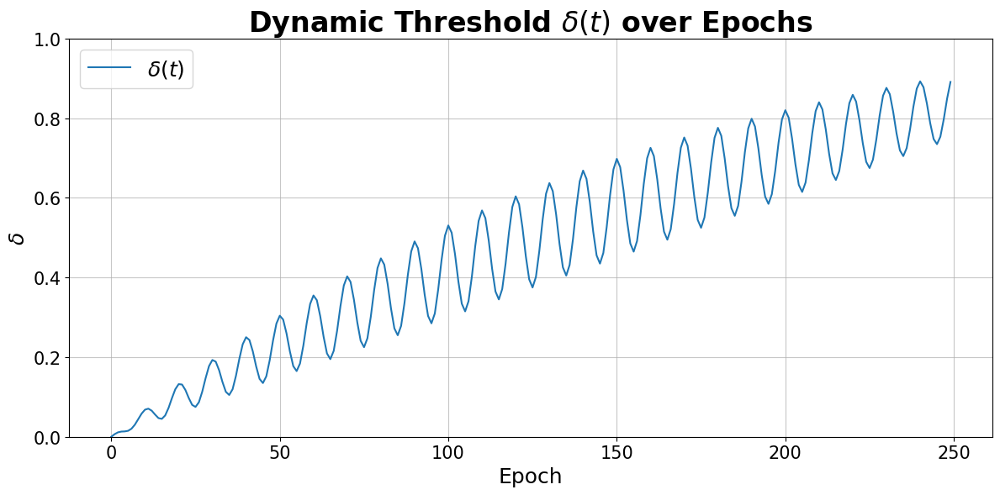

In [218]:
threshold_values = create_threshold_list(
                    min_threshold_start = - 0.0,# Starting minimum threshold value,
                    max_threshold = 1.0,       # Maximum threshold value
                    growth_rate = 0.004  ,     # Growth rate to control increase within the range
                    min_increase_rate = 0.003, # Rate at which the minimum threshold increases
                    num_iterations = 250       # Total number of iterations to match the pattern
                    )

In [219]:
criterion = nn.SmoothL1Loss()
criterion = nn.HuberLoss(delta= 2.0)
#criterion = nn.BCEWithLogitsLoss()  

class Loss(nn.Module):
    def __init__(self, quantile):
        super(Loss, self).__init__()
        self.quantile = 0.7
        self.alpha = 0.0005
        self.criterion = nn.HuberLoss(delta= 2.0)

    def forward(self, y_pred, y_true, spike_y = None):
        # Calculate error
        error = y_true - y_pred
        
        # Apply quantile loss formula
        loss = torch.max((self.quantile - 1) * error, self.quantile * error)
        quantile_loss = torch.mean(loss)
        #event_loss = self.event_loss(y_true,y_pred,threshold=1.3)
        #corr_loss =  self.correlation_loss(y_true,y_pred)
        mse_loss = self.weighted_mse(y_true,y_pred,spike_y) 
        #shape_loss = self.shape_loss(y_true, y_pred)
        #phase_loss = self.phase_loss(y_true,y_pred)
        l1_regularization = self.l1_regularization(y_pred)
        corr_loss = self.correlation_loss(y_true, y_pred)
        total_loss =  mse_loss + 0.01 * l1_regularization
        
        
        return total_loss


    def generate_weigths(self,y_true,spike_y):
        spikes = (y_true > 50 ).float()
        weights = torch.where(spikes == 1, 5, 1)

        return weights

    def weighted_mse(self, y_true, y_pred, spike_y=None):
        """
        Compute mean squared error loss, optionally weighted by spike_y.
        """
        error = y_true - y_pred
        squared_error = error ** 2
      

        if spike_y is not None:
            weights = torch.exp(spike_y)

            log_spike_y = torch.log(spike_y + 1e-6)
            log_spike_y = torch.where(log_spike_y > 0, log_spike_y, torch.tensor(1.0, device=log_spike_y.device))
            weighted_error = squared_error *  log_spike_y * 0.4
            mse_loss = torch.mean(weighted_error)
        else:
            mse_loss = torch.mean(squared_error)
        
        return mse_loss



    def shape_loss(self,true_y, pred_y):
        norm_true = (true_y - true_y.mean(dim=-1, keepdim=True)) / true_y.std(dim=-1, keepdim=True)
        norm_pred = (pred_y - pred_y.mean(dim=-1, keepdim=True)) / pred_y.std(dim=-1, keepdim=True)
        return torch.mean((norm_true - norm_pred) ** 2)


    def event_loss(self,true_y, pred_y, threshold=2):
        true_events = (true_y > threshold).float()
        pred_events = (pred_y > threshold).float()
        return torch.nn.BCELoss()(pred_events, true_events)

    
    def correlation_loss(self,true_y, pred_y):
        true_mean = true_y.mean(dim=-1, keepdim=True)
        pred_mean = pred_y.mean(dim=-1, keepdim=True)
        true_centered = true_y - true_mean
        pred_centered = pred_y - pred_mean
        corr = torch.sum(true_centered * pred_centered, dim=-1) / (
            torch.sqrt(torch.sum(true_centered ** 2, dim=-1)) * torch.sqrt(torch.sum(pred_centered ** 2, dim=-1)) + 1e-8
        )
        return 1 - torch.mean(corr) 


    def frequency_loss(self,true_y, pred_y):
        """
        Compute the frequency-domain loss between true values and predictions.

        Args:
        - true_y (torch.Tensor): True values, shape [batch_size, sequence_length].
        - pred_y (torch.Tensor): Predicted values, shape [batch_size, sequence_length].

        Returns:
        - loss (torch.Tensor): Scalar frequency loss.
        """
        # Perform FFT on true and predicted values
        true_fft = torch.fft.fft(true_y, dim=-1)  # Shape: [batch_size, sequence_length]
        pred_fft = torch.fft.fft(pred_y, dim=-1)  # Shape: [batch_size, sequence_length]
        
        # Compute magnitude spectra (ignore phase for now)
        true_mag = torch.abs(true_fft)
        pred_mag = torch.abs(pred_fft)
        
        # Compute the mean squared error between the magnitude spectra
        freq_loss = torch.mean((true_mag - pred_mag) ** 2)
        return freq_loss

 
    def loss_mse(self,y_pred, y_true):
        #loss = F.mse_loss(y_true, y_pred)
        loss = criterion(y_pred, y_true)
        return loss

    def correlation_loss(self, y_true, y_pred):
        """
        Computes the correlation-based loss between the true and predicted values.
        A perfect correlation results in a loss of 0, and lower correlations result in higher loss.

        Args:
            y_true (torch.Tensor): Ground truth values, shape [batch_size, sequence_length].
            y_pred (torch.Tensor): Predicted values, shape [batch_size, sequence_length].

        Returns:
            torch.Tensor: Scalar correlation loss.
        """
        # Compute the means
        true_mean = y_true.mean(dim=-1, keepdim=True)
        pred_mean = y_pred.mean(dim=-1, keepdim=True)

        # Center the tensors by subtracting the mean
        true_centered = y_true - true_mean
        pred_centered = y_pred - pred_mean

        # Compute the numerator: sum of element-wise products
        numerator = torch.sum(true_centered * pred_centered, dim=-1)

        # Compute the denominators: product of standard deviations
        true_std = torch.sqrt(torch.sum(true_centered ** 2, dim=-1) + 1e-8)  # Avoid division by zero
        pred_std = torch.sqrt(torch.sum(pred_centered ** 2, dim=-1) + 1e-8)

        denominator = true_std * pred_std

        # Compute the correlation for each example in the batch
        correlation = numerator / denominator

        # Loss is 1 - mean correlation (maximize correlation)
        correlation_loss = 1 - torch.mean(correlation)

        return correlation_loss

   

    def l1_regularization(self, y_pred):
        """
        Apply L1 regularization to the predicted values.

        Args:
        - y_pred (torch.Tensor): Predicted values, shape [batch_size, sequence_length].

        Returns:
        - torch.Tensor: Scalar L1 regularization term.
        """
        return torch.mean(torch.abs(y_pred))  # L1 norm





def loss_func(y_pred, y_true):
    loss = F.mse_loss(y_true, y_pred)
    #loss = criterion(y_pred, y_true)
    return loss










In [220]:
SPLIT_TO_RUN = 6


def eval(model, data_loader_val, device, threshold = 0.17, last_epoch=False):
    """Evaluate the model on the validation set and return the average loss."""
    model.eval()  # Set model to evaluation mode
    total_val_loss = 0.0
    with torch.no_grad():  # Disable gradient computation for validation
        for val_x , val_y in data_loader_val:
            val_x, val_y = [item.float().to(device) for item in [val_x, val_y]]
            val_out = model(val_x, threshold, last_epoch=last_epoch, inference = True)
            #true_next = torch.cat((val_x, val_y), dim=2)
            loss = loss_func(val_out, val_y)
            total_val_loss += loss.item()
    
    # Calculate and return average validation loss
    avg_val_loss = total_val_loss / len(data_loader_val)
    return avg_val_loss

def train_and_eval_for_splits(model, data_loaders_train, data_loaders_val, threshold_values, device="cuda", lr=0.001, use_pred=False, num_epoch=250):
    """
    Train and evaluate the model for multiple splits, using split-specific DataLoaders and threshold values,
    with an added consistency loss for overlapping predictions.
    """
    all_split_results = {}  # To store results for each split
    model.to(device)
    for i, (data_loader_train, data_loader_val) in enumerate(zip(data_loaders_train, data_loaders_val), 1):
        print(f"Starting training for Split {i}...")
        mse_loss = Loss(0.9)

        if i != SPLIT_TO_RUN:
            # Skip this split
            continue

        # Initialize optimizer and scheduler
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)
        scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda epoch: 1 - (epoch / num_epoch))
        
        train_loss_list = []
        val_loss_list = []
        last_epoch = False
        j = 0
        
        model.gdn.init_params()
        model.gdn.adj_matrix = None
        model.gdn.all_topk_indices.clear()
        model.gdn.all_cos_scores.clear()
        model.gdn.all_adj.clear()
        
        # Training for each split
        for epoch in range(num_epoch):
            if epoch == num_epoch - 1:
                last_epoch = True
            
            # Training Loop
            model.train()  # Ensure the model is in training mode
            total_train_loss = 0.0
            num_batches = 0

            for seq_x, seq_y in data_loader_train:
                
                seq_x, seq_y = [item.float().to(device) for item in [seq_x, seq_y]]
                optimizer.zero_grad()

                # Use the threshold value specific to this split
                threshold = threshold_values[j]
                out = model(seq_x,threshold, last_epoch=last_epoch)
                # Compute prediction loss (e.g., quantile loss)


                #true_next = torch.cat((seq_x, seq_y), dim=2)
                pred_loss = mse_loss(out, seq_y, spike_y = None)

                # Combine the losses
                total_loss = pred_loss
                total_loss.backward()
                optimizer.step()
                # Update metrics
                total_train_loss += total_loss.item()
                num_batches += 1


                #with torch.no_grad():
                    #model.gdn.embedding_momentum.weight.mul_(model.gdn.momentum_p).add_((1 - model.gdn.momentum_p) * model.gdn.embedding.weight.data)
            
            # Calculate average training loss for the epoch
            avg_train_loss = total_train_loss / num_batches
            train_loss_list.append(avg_train_loss)
            print(f"Split {i} - Epoch: {epoch} - Average Training Loss: {avg_train_loss}, Threshold Value: {threshold}")
            
            # Step the learning rate scheduler
            scheduler.step()

            # Validation Loop
            avg_val_loss = eval(model, data_loader_val, device, threshold, last_epoch=last_epoch)
            val_loss_list.append(avg_val_loss)
            print(f"Split {i} - Epoch: {epoch} - Average Validation Loss: {avg_val_loss}")
            j += 1
        
        # Store results for this split
        all_split_results[f"Split_{i}"] = {
            "model": model.state_dict(),  # Save the trained model's state dict
            "train_loss": train_loss_list,
            "val_loss": val_loss_list
        }

    return all_split_results, model


In [221]:
all_split_results, model = train_and_eval_for_splits(model=model,data_loaders_val=data_loaders_val,threshold_values=threshold_values,data_loaders_train=data_loaders_train)


Starting training for Split 1...
Starting training for Split 2...
Starting training for Split 3...
Starting training for Split 4...
Starting training for Split 5...
Starting training for Split 6...
Split 6 - Epoch: 0 - Average Training Loss: 1.0720278819402058, Threshold Value: 0.0
Split 6 - Epoch: 0 - Average Validation Loss: 1.03425931930542
Split 6 - Epoch: 1 - Average Training Loss: 0.9284087618192037, Threshold Value: 0.006599975136544976
Split 6 - Epoch: 1 - Average Validation Loss: 1.0346051454544067
Split 6 - Epoch: 2 - Average Training Loss: 0.8661397496859232, Threshold Value: 0.011183888368784492
Split 6 - Epoch: 2 - Average Validation Loss: 1.0429240465164185
Split 6 - Epoch: 3 - Average Training Loss: 0.8238808711369833, Threshold Value: 0.013084031752667157
Split 6 - Epoch: 3 - Average Validation Loss: 1.058454155921936
Split 6 - Epoch: 4 - Average Training Loss: 0.792396624883016, Threshold Value: 0.013497517588844073
Split 6 - Epoch: 4 - Average Validation Loss: 1.07498

In [223]:
train_loss_list = all_split_results['Split_6']['train_loss']
val_loss_list = all_split_results['Split_6']['val_loss']

### After training Analysis

In [224]:
def plot_loss_curves(train_loss_list, val_loss_list, split, save_path="loss_curve_split_{split}.png"):
    plt.figure(figsize=(10, 8))
    plt.plot(train_loss_list, label='Training Loss', linewidth=2)
    plt.plot(val_loss_list, label='Validation Loss', linewidth=2)
    plt.title(f'Loss Curve: Split {split}', fontsize=24, weight='bold')
    plt.xlabel('Epoch', fontsize=20)
    plt.ylabel('Loss', fontsize=24)
    plt.legend(fontsize=18)
    plt.xticks(fontsize=16)  # Adjust size of x-axis tick numbers
    plt.yticks(fontsize=16)  # Adjust size of y-axis tick numbers
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.savefig(save_path.format(split=split), dpi=300)
    plt.show()

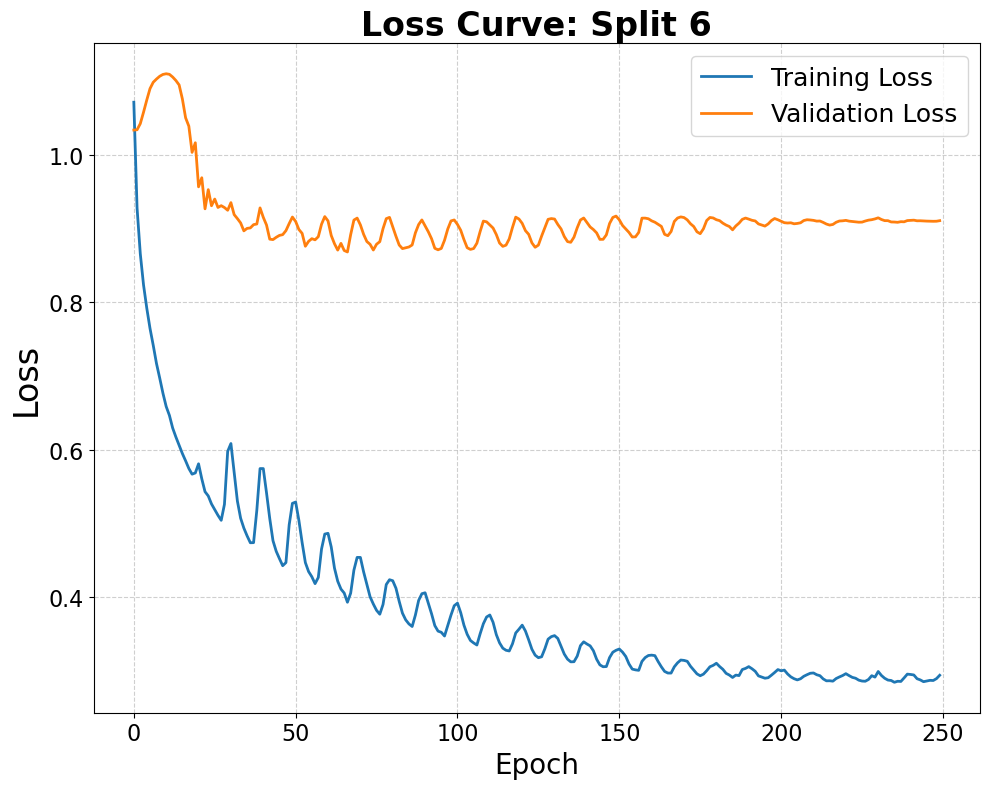

In [225]:
plot_loss_curves(train_loss_list, val_loss_list, SPLIT_TO_RUN)

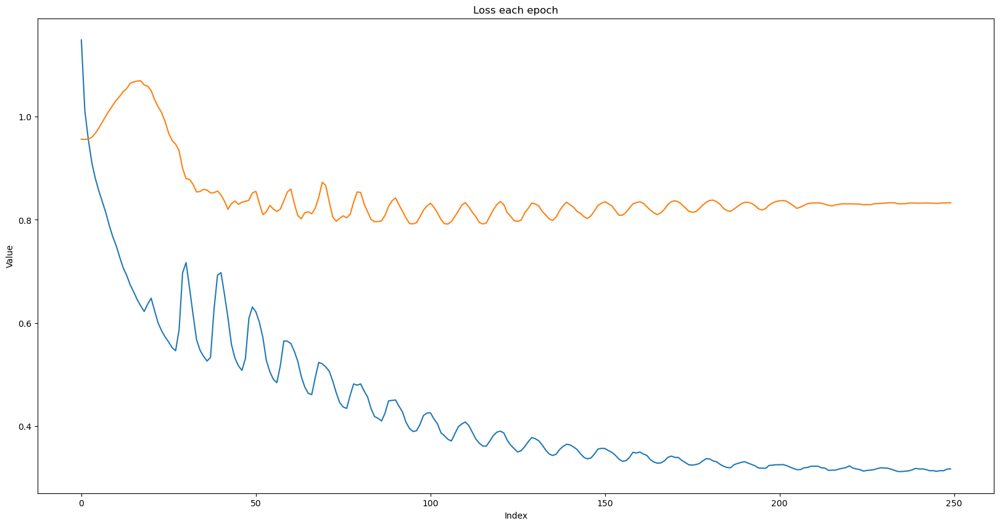

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
plt.plot(train_loss_list)
plt.plot(val_loss_list)
plt.title('Loss each epoch')
plt.xlabel('Index')
plt.ylabel('Value')
plt.show()

In [ ]:
import torch
import numpy as np

model.eval() 
total_val_loss = 0.0
inputs = []
predictions = []
true_values = []
mse_per_series = []  
corr_per_series = []
num_batches = 0
data_loader_val = data_loaders_val[-1]
data_loader_train= data_loaders_train[-1]
loss_func = Loss(quantile=0.7)
with torch.no_grad():  
    for val_x, val_y in data_loader_val:
        val_x, val_y = [item.float().to(DEVICE) for item in [val_x, val_y]]
        
        val_out = model(val_x,0.5, last_epoch=True,inference=True)
        
        #true_next = torch.cat((val_x, val_y), dim=2)

        # Calculate overall loss
        loss = loss_func(val_out, val_y) 
        total_val_loss += loss.item()
        num_batches += 1

        # Append batch inputs, predictions, and true values
        inputs.append(val_x.squeeze(-1).cpu().detach().numpy())
        predictions.append(val_out.squeeze(-1) .cpu().detach().numpy())    
        true_values.append(val_y.squeeze(-1) .cpu().detach().numpy())
        
         # Calculate MSE for each time series
        batch_mse = torch.mean((val_out - val_y) ** 2, dim=(0, 2)).cpu().numpy()
        mse_per_series.append(batch_mse)

        # Calculate correlation for each time series using self.correlation_loss
        batch_corr = []
        for ts_idx in range(val_y.size(1)):  # Iterate over num_time_series
            ts_true = val_y[:, ts_idx, :].detach()  # Shape: [batch_size, features]
            ts_pred = val_out[:, ts_idx, :].detach()  # Shape: [batch_size, features]

            # Use self.correlation_loss for each time series
            ts_corr_loss = loss_func.correlation_loss(ts_true, ts_pred)
            ts_corr = 1 - ts_corr_loss.item()  # Convert loss to correlation
            batch_corr.append(ts_corr)

        corr_per_series.append(batch_corr)

# Convert results to numpy arrays for analysis
mse_per_series = np.array(mse_per_series)  # Shape: [num_batches, num_time_series]
average_mse_per_series = mse_per_series.mean(axis=0)  # Average MSE across batches for each time series

corr_per_series = np.array(corr_per_series)  # Shape: [num_batches, num_time_series]
average_corr_per_series = corr_per_series.mean(axis=0)  # Average correlation across batches for each time series




# Print results
print(f"Validation Loss (total): {total_val_loss / num_batches}")
print(f"Average MSE per time series: {average_mse_per_series}")
print(f"Average Correlation per time series: {average_corr_per_series}")

# Identify top 10 time series with the best and worst correlation
best_corr_indices = np.argsort(average_corr_per_series)[-10:]  # Indices of the 10 best (highest) correlation
worst_corr_indices = np.argsort(average_corr_per_series)[:10]  # Indices of the 10 worst (lowest) correlation

# Identify top 10 time series with the best and worst correlation
worst_mse_indices = np.argsort(average_mse_per_series)[-10:]  # Indices of the 10 best (highest) correlation
best_mse_indices = np.argsort(average_mse_per_series)[:10]  # Indices of the 10 worst (lowest) correlation

# Print top/bottom series for MSE
print("\nTop 10 time series with the best (lowest) MSE:")
for i, idx in enumerate(best_mse_indices, 1):
    print(f"{i}. Series {idx}: MSE = {average_mse_per_series[idx]:.4f}")


print("\nTop 10 time series with the worst (highest) MSE:")
for i, idx in enumerate(worst_mse_indices[::-1], 1):
    print(f"{i}. Series {idx}: MSE = {average_mse_per_series[idx]:.4f}")

# Print top/bottom series for correlation
print("\nTop 10 time series with the best (highest) correlation:")
for i, idx in enumerate(best_corr_indices[::-1], 1):
    print(f"{i}. Series {idx}: Correlation = {average_corr_per_series[idx]:.4f}")

print("\nTop 10 time series with the worst (lowest) correlation:")
for i, idx in enumerate(worst_corr_indices, 1):
    print(f"{i}. Series {idx}: Correlation = {average_corr_per_series[idx]:.4f}")

# Use first batch for visualization if needed
inputs = inputs[0]
predictions = predictions[0]
true_values = true_values[0]

Validation Loss (total): 0.9330679178237915
Average MSE per time series: [1.7238128  0.63088816 1.0350599  1.3587753  1.5764474  2.8208525
 1.3173016  0.8684356  0.34731638 1.4500796  0.7437118  1.0365355
 1.3511139  1.166185   1.0126873  0.47504002 1.6009316  0.82550514
 0.7758656  0.5906089  0.7146436  0.7575903  0.704583   0.9271391
 0.97415227 0.80339664 1.1065384  1.5504259  2.507654   0.72165465
 0.9271189  0.5624494  1.6105838  0.5675489  0.6070167  2.456714
 1.4112844  0.5731637  1.0702795  0.8452841  0.58023643 0.6655214
 0.8205223  1.2369174  1.1982133  0.7055588  1.2722241  0.9273477
 0.5949647  1.1311542  1.4175832  0.7742939  0.62097365 1.151932
 0.7929182  0.82727855 0.8367702  0.798551   0.5666115  0.69159263
 0.6884862  0.5617016  0.8780432  0.8830783  0.74538594 0.68366456
 0.91333884 0.9045699  0.6456828  0.76946944 0.584749   0.6408856
 0.7904299  0.5576677  0.8818824  0.67390096 0.6357172  0.70463705
 0.59605575 0.6612364  0.7872612  0.80690306 0.8721341  0.7530316


In [ ]:
average_corr_per_series.mean(axis=0)

0.21088961832124184

In [ ]:
metrics_df = pd.DataFrame({
    'Correlation': average_corr_per_series,
    'MSE': average_mse_per_series
})

#metrics_df.to_csv("metrics_df.csv",index=False)

In [ ]:
average_mse_per_series.shape

(221,)

In [ ]:
data_loader_val.__len__()

1

In [ ]:
avg_train_loss = total_val_loss / num_batches
avg_train_loss

0.9330679178237915

In [ ]:
best_corr_indices

array([ 32, 144, 104,   5,  42,   3,   8, 187,   6,  90])

In [ ]:
worst_corr_indices

array([204, 152,  73, 123, 129, 117,  81, 217,  58, 165])

In [ ]:
average_corr_per_series[1]

0.20290499925613403

In [ ]:
average_mse_per_series[0]

1.7238128

In [ ]:

import numpy as np
import plotly.graph_objects as go


series = 31
window_size = predictions.shape[2]  # Size of each time window

fig = go.Figure()

for seq_index in range(predictions.shape[0]):
    # Flatten along the sequence dimension to create a single continuous time series
    true_values_flat = true_values[seq_index][series]
    predictions_flat = predictions[seq_index][series]

    # Determine the starting position of the current window on the x-axis
    x_true = np.arange(seq_index * window_size, seq_index * window_size + len(true_values_flat))
    x_pred = np.arange(seq_index * window_size, seq_index * window_size + len(predictions_flat))

    # Add traces for the current sequence
    fig.add_trace(go.Scatter(
        x=x_true,
        y=true_values_flat,
        mode='lines',
        name=f'True Values (Window {seq_index})',
        line=dict(color='blue', dash='dash'),
        legendgroup='True Values',
        showlegend=(seq_index == 0)  # Show legend only for the first window
    ))

    fig.add_trace(go.Scatter(
        x=x_pred,
        y=predictions_flat,
        mode='lines',
        name=f'Predictions (Window {seq_index})',
        line=dict(color='red'),
        legendgroup='Predictions',
        showlegend=(seq_index == 0)
    ))

# Step 3: Customize layout
fig.update_layout(
    title=f"Predictions and True Values Across All Sequences for Time Series {series}",
    xaxis_title="Global Time Steps",
    yaxis_title="Value",
    legend=dict(x=0.02, y=0.98)  # Position the legend
)

# Display the figure
fig.show()


KeyboardInterrupt: 

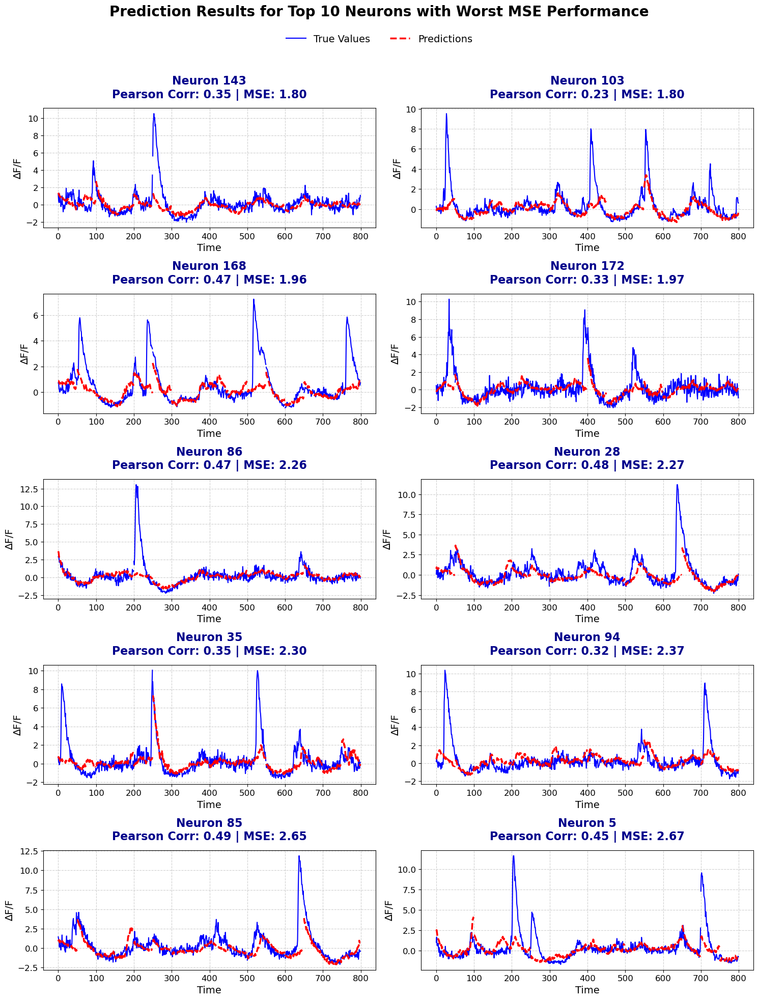

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

series_list = worst_mse_indices  # List of series to plot
window_size = predictions.shape[2]  # Size of each time window

fig, axes = plt.subplots(5, 2, figsize=(15, 20))  # Create a grid of subplots (5 rows, 2 columns)
axes = axes.flatten()  # Flatten the axes array for easier indexing

for idx, series in enumerate(series_list):
    ax = axes[idx]  # Select the subplot for the current series

    for seq_index in range(predictions.shape[0]):
        # Flatten along the sequence dimension to create a single continuous time series
        true_values_flat = true_values[seq_index][series]
        predictions_flat = predictions[seq_index][series]

        # Determine the starting position of the current window on the x-axis
        x_true = np.arange(seq_index * window_size, seq_index * window_size + len(true_values_flat))
        x_pred = np.arange(seq_index * window_size, seq_index * window_size + len(predictions_flat))

        # Plot the current sequence
        ax.plot(
            x_true, true_values_flat,
            color='blue', linestyle='-', linewidth=1.5, label="True Values" if seq_index == 0 else None
        )

        ax.plot(
            x_pred, predictions_flat,
            color='red', linestyle='--', linewidth=2.5, label="Predictions" if seq_index == 0 else None
        )

    # Customize each subplot
    corr = average_corr_per_series[series]
    mse = average_mse_per_series[series]
    ax.set_title(
        f"Neuron {series}\nPearson Corr: {corr:.2f} | MSE: {mse:.2f}",
        fontsize=16, fontweight='bold', color='darkblue', pad=15
    )
    ax.set_xlabel("Time", fontsize=14)
    ax.set_ylabel("∆F/F", fontsize=14)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)

# Add a single global legend for all subplots
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(
    handles, labels, loc='upper center', fontsize=14, ncol=2, frameon=False,
    bbox_to_anchor=(0.5, 0.96)  # Adjust the position of the legend below the title
)

# Add a global title for the entire figure
plt.suptitle(
    "Prediction Results for Top 10 Neurons with Worst MSE Performance",
    fontsize=20, fontweight='bold', y=0.98, color='black'
)
plt.tight_layout(rect=[0, 0, 1, 0.94])  # Adjust layout to make space for the global title and legend
#plt.savefig("prediction_results_top_10_neurons_mse_worst.png", dpi=400, bbox_inches='tight', format='png')
plt.show()


In [ ]:

time_win = 3
# Flatten along the sequence dimension to create a single continuous time series
true_values_flat = true_values[time_win][series]
predictions_flat = predictions[time_win][series]
input_flat = inputs[time_win][series]
#reconstructions_flat = reconstructions[time_win][series]

combined_true_values = np.concatenate([input_flat, true_values_flat])
combined_predictions = np.concatenate([np.full_like(input_flat, np.nan), predictions_flat])  

# Step 4: Create the Plotly figure
fig = go.Figure()

# Plot the input sequence
fig.add_trace(go.Scatter(
    y=input_flat,
    mode='lines',
    name='Inputs',
    line=dict(color='green', dash='dot')
))


# Plot true values, starting right after the input sequence
fig.add_trace(go.Scatter(
    y=combined_true_values,
    mode='lines',
    name='True Values',
    line=dict(color='blue', dash='dash')
))

# Plot predictions, aligning them with true values after the input sequence
fig.add_trace(go.Scatter(
    y=combined_predictions,
    mode='lines',
    name='Predictions',
    line=dict(color='red')
))

# Step 5: Customize layout
fig.update_layout(
    title=f"Inputs followed by Predictions vs. True Values for Time Series {series}",
    xaxis_title="Time Steps",
    yaxis_title="Value",
    legend=dict(x=0.02, y=0.98)  # Position the legend
)

# Display the figure
fig.show()

In [ ]:
len(model.all_adj)

AttributeError: 'GDN_Dynamic' object has no attribute 'all_adj'

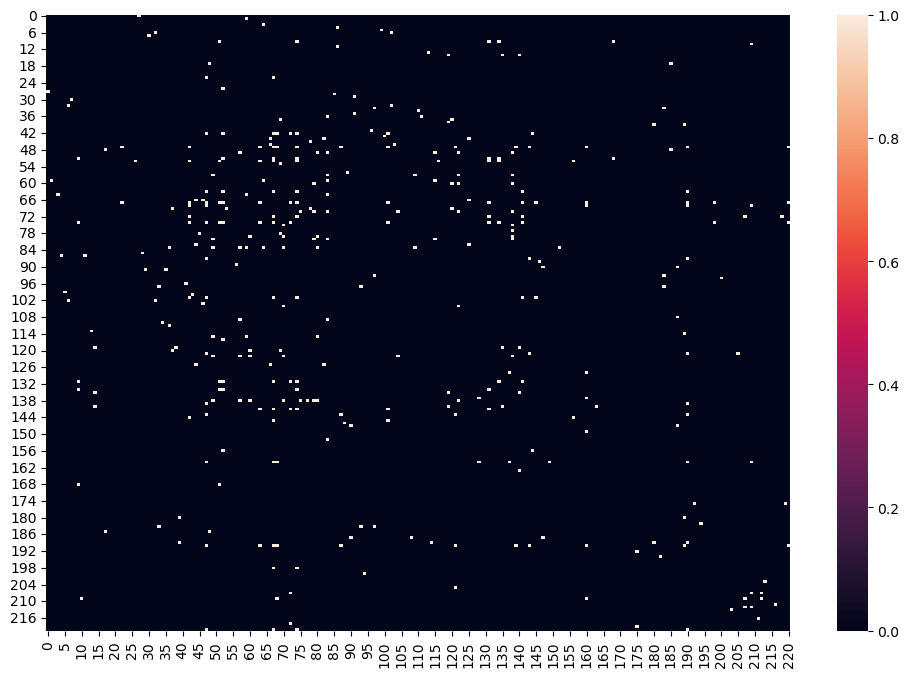

In [ ]:

import seaborn as sns

plt.figure(figsize=(12, 8)) 
sns.heatmap(model.gdn.all_adj[-1], cmap="rocket", annot=False, cbar=True, vmax=1, vmin=0)

plt.savefig("adj_delta_05.png", dpi=300, bbox_inches='tight', format='png')

plt.show()


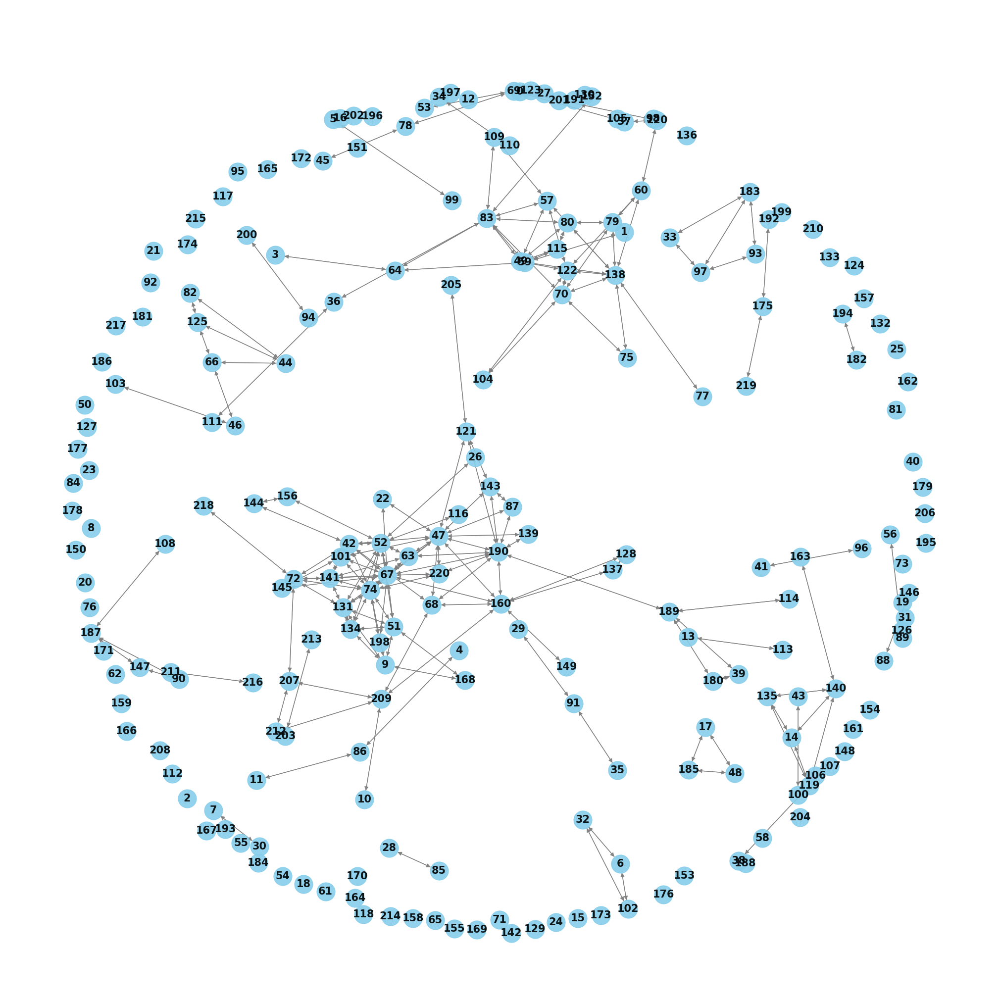

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
# Assuming `model.gdn.all_adj[-1]` is the adjacency matrix
# Assuming `model.gdn.all_adj[-1]` is the adjacency matrix
adj_matrix = np.array(model.gdn.all_adj[-1])  # Convert to a NumPy array if not already

# Create a directed graph from the adjacency matrix
G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)

# Use a spring layout with spread-out nodes
pos = nx.spring_layout(G, k=0.8, iterations=175, seed=42)  # Adjust `k` to spread nodes

# Plot the graph with improved aesthetics
plt.figure(figsize=(20, 20))
nx.draw(
    G, pos,
    with_labels=True,
    node_size=700,             # Adjust node size
    node_color="skyblue",      # Node color
    font_size=15,               # Smaller font size
    font_weight="bold",
    edge_color="gray",         # Lighter edge color
    arrowsize=12,              # Arrow size
    alpha=0.9                  # Transparent edges
)
#plt.title("Vi", fontsize=16)

plt.savefig("graph_learned.png", dpi=300, bbox_inches='tight', format='png')
plt.show()

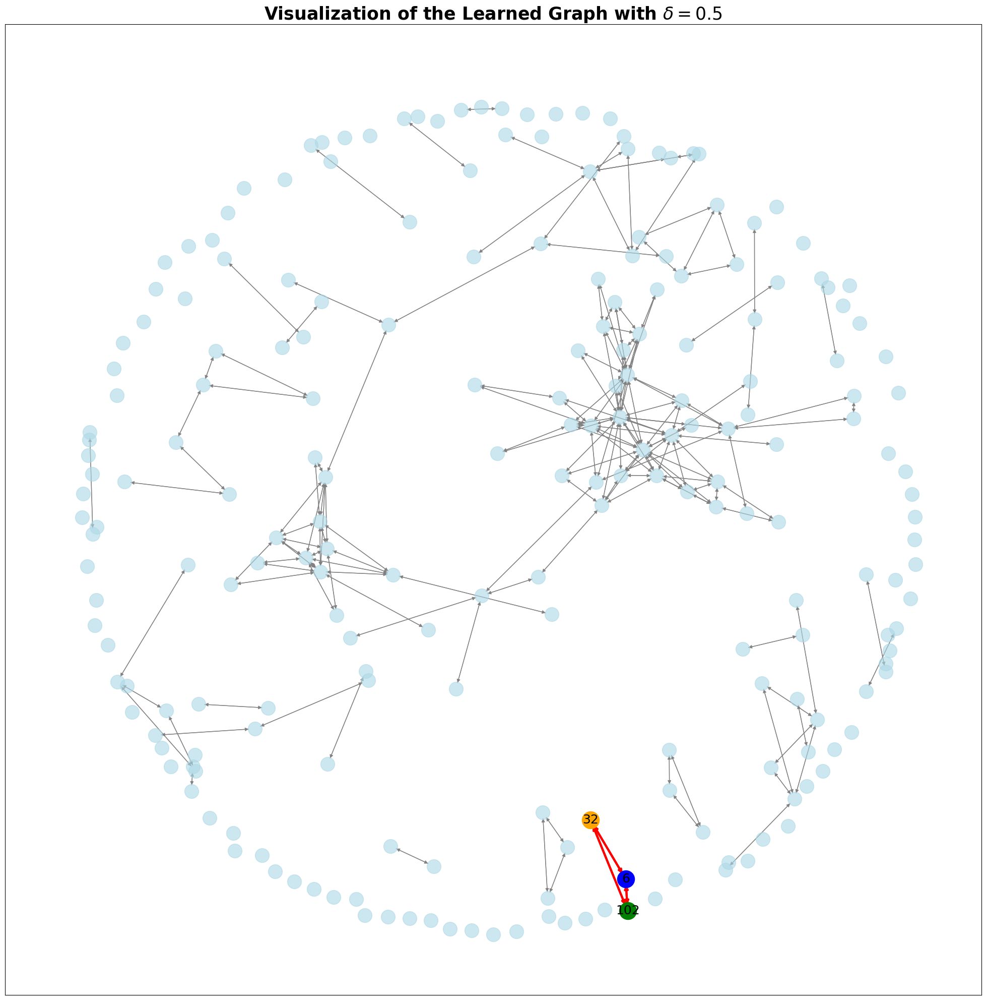

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Assuming `model.gdn.all_adj[-1]` is the adjacency matrix
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

# Assuming `model.gdn.all_adj[-1]` is the adjacency matrix
adj_matrix = np.array(model.gdn.all_adj[-1])  # Convert to a NumPy array if not already

# Create a directed graph from the adjacency matrix
G = nx.from_numpy_array(adj_matrix, create_using=nx.DiGraph)

# Nodes to highlight with specific colors
highlight_nodes_colors = {32: "orange", 6: "blue", 102: "green"}

# Get edges connected to the highlighted nodes
highlight_edges = [(u, v) for u, v in G.edges() if u in highlight_nodes_colors or v in highlight_nodes_colors]

# Define positions using a layout
pos = nx.spring_layout(G, k=0.8, iterations=175, seed=42)

# Plot the graph
plt.figure(figsize=(25, 25))

# Draw all nodes with lower opacity
nx.draw_networkx_nodes(
    G, pos,
    node_size=400,
    node_color="lightblue",
    alpha=0.6  # Low opacity for background nodes
)

# Draw all edges with lower opacity
nx.draw_networkx_edges(
    G, pos,
    edge_color="gray",
    alpha=0.9  # Low opacity for background edges
)

# Highlight specific nodes with their respective colors
for node, color in highlight_nodes_colors.items():
    nx.draw_networkx_nodes(
        G, pos,
        nodelist=[node],
        node_size=600,
        node_color=color
    )

# Highlight edges connected to specific nodes
nx.draw_networkx_edges(
    G, pos,
    edgelist=highlight_edges,
    edge_color="red",  # Highlighted edges in red
    width=3
)

# Draw labels for highlighted nodes
nx.draw_networkx_labels(
    G, pos,
    labels={node: str(node) for node in highlight_nodes_colors},
    font_size=18,
    font_color="black"
)

# Title with bold styling
plt.title(r"Visualization of the Learned Graph with $\delta = 0.5$", fontsize=25, weight="bold")
plt.savefig("graph_learned.png", dpi=300, bbox_inches='tight', format='png')
plt.show()



### Video of adjency matrix

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.animation import FuncAnimation

def init_heatmap():
    fig, ax = plt.subplots()
    sns.heatmap(model.all_adj[0], ax=ax, cbar=True, annot=False)
    return fig, ax

def update_heatmap(frame, ax):
    ax.clear()
    sns.heatmap(model.all_adj[frame], ax=ax, cbar=False, annot=False)

#fig, ax = init_heatmap()
#anim = FuncAnimation(fig, update_heatmap, frames=len(model.all_adj), fargs=(ax,), interval=200)

#anim.save('animated_adjencyMatrix.mp4', writer='ffmpeg')


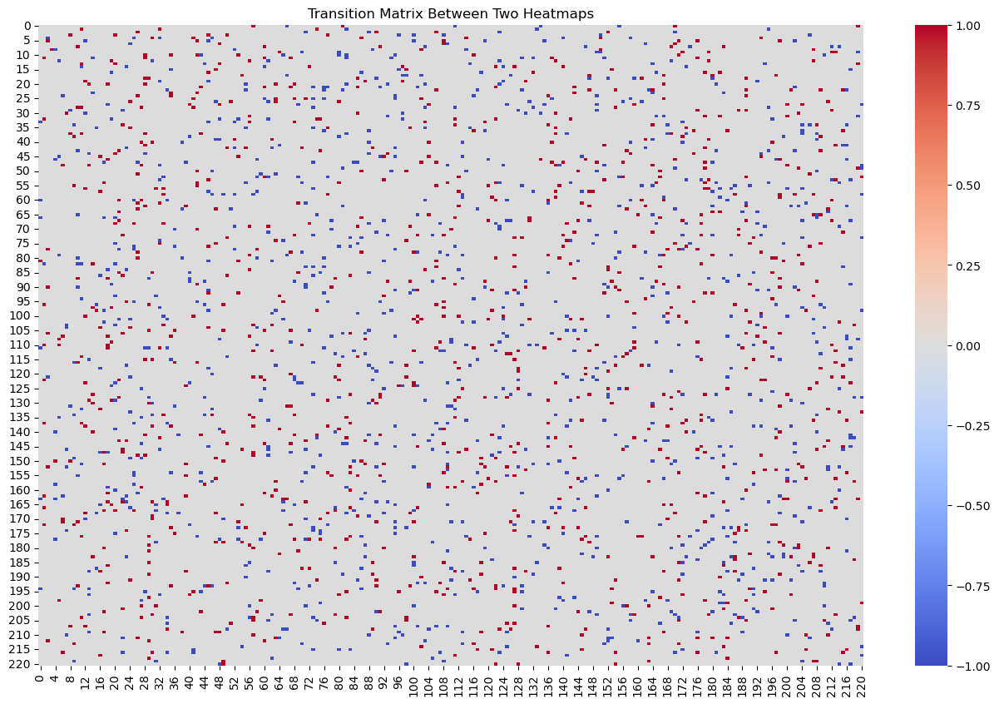

In [ ]:
transition_matrix = compute_transition(model.gdn.all_adj[0], model.gdn.all_adj[40])
"""
Blue (-1) represents removed connections,
Red (1) represents new connections,
White (0) indicates no change.

"""
# Plot the transition matrix
plt.figure(figsize=(16, 10))  # Set the figure size as needed
sns.heatmap(transition_matrix, cmap="coolwarm", annot=False, cbar=True, center=0, vmax=1, vmin=-1)
plt.title("Transition Matrix Between Two Heatmaps")
plt.show()


In [ ]:
transition_matrix

array([[0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

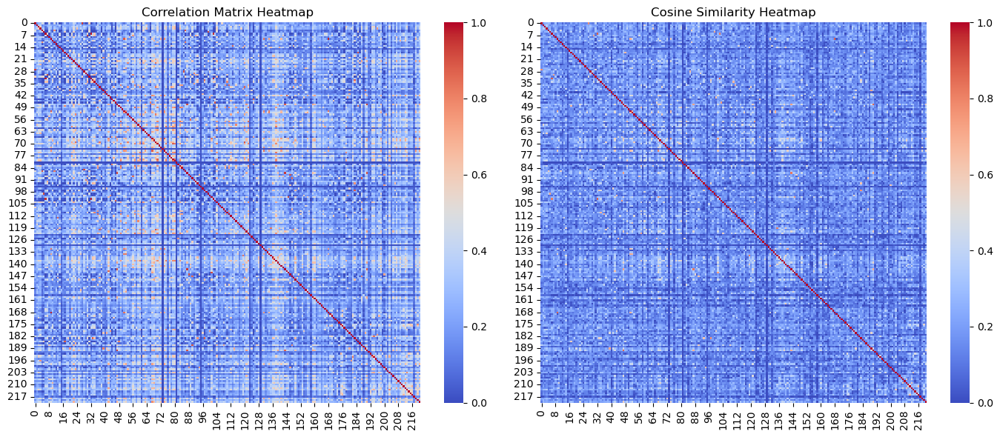

In [ ]:
# Set up a figure with two subplots side by side
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Plot the first heatmap on the left
sns.heatmap(correlation_matrix.values, cmap="coolwarm", annot=False, cbar=True, vmax=1, vmin=0, ax=ax[0])
ax[0].set_title("Correlation Matrix Heatmap")

# Plot the second heatmap on the right
sns.heatmap(model.gdn.all_cos_scores[-1], cmap="coolwarm", annot=False, cbar=True, vmax=1, vmin=-0.0, ax=ax[1])
ax[1].set_title("Cosine Similarity Heatmap")

# Adjust layout for a cleaner look
plt.tight_layout()
plt.show()

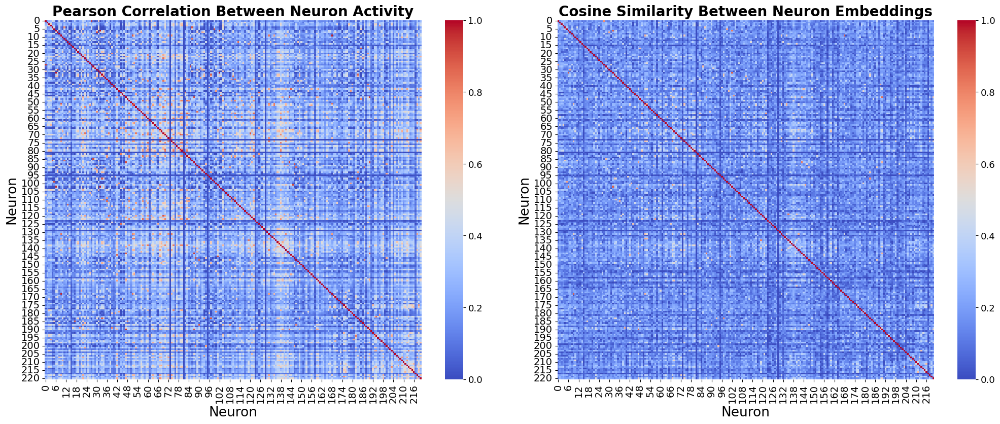

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up a figure with two subplots side by side
fig, ax = plt.subplots(1, 2, figsize=(21, 9))

# Plot the first heatmap on the left: Pearson correlation between neuron activity
heatmap_left = sns.heatmap(
    correlation_matrix.values, 
    cmap="coolwarm", 
    annot=False, 
    cbar=True, 
    vmax=1, 
    vmin=0, 
    ax=ax[0]
)

ax[0].set_title("Pearson Correlation Between Neuron Activity", fontsize=20, fontweight='bold')
ax[0].set_xlabel("Neuron", fontsize=19)
ax[0].set_ylabel("Neuron", fontsize=19)
ax[0].tick_params(axis='both', labelsize=14)
#cbar_left.ax.set_title("Correlation", fontsize=14, pad=15) 
#ax[0].set_xlabel(r"$\mathbf{x}_j$", fontsize=16)
#ax[0].set_ylabel(r"$\mathbf{x}_i$", fontsize=16)

# Adjust color bar font size
cbar_left = heatmap_left.collections[0].colorbar
ax[0].tick_params(axis='both', labelsize=14)
cbar_left.ax.tick_params(labelsize=13)

# Plot the second heatmap on the right: Cosine similarity
heatmap_right = sns.heatmap(
    model.gdn.all_cos_scores[-1], 
    cmap="coolwarm", 
    annot=False, 
    cbar=True, 
    vmax=1, 
    vmin=0, 
    ax=ax[1]
)
ax[1].set_title("Cosine Similarity Between Neuron Embeddings", fontsize=20, fontweight='bold')
ax[1].set_xlabel("Neuron", fontsize=19)
ax[1].set_ylabel("Neuron", fontsize=19)
ax[1].tick_params(axis='both', labelsize=14)
# Adjust color bar font size
cbar_right = heatmap_right.collections[0].colorbar
cbar_right.ax.tick_params(labelsize=13)

# Adjust layout for a cleaner look
plt.tight_layout(pad=3) 
plt.savefig("heatmap_neurons.png", dpi=300, bbox_inches='tight', format='png')
plt.show()


In [ ]:
node_index = 6
top_n = 10

top_neighbors = model.gdn.get_top_neighbors(node_index, top_n=top_n,use_weighted=False)
print(f"Top {top_n} neighbors for node {node_index}:")
for neighbor, similarity in top_neighbors:
    print(f"Node {neighbor} with similarity {similarity:.4f}")

Top 10 neighbors for node 6:
Node 32 with similarity 0.8758
Node 102 with similarity 0.8011
Node 34 with similarity 0.4052
Node 177 with similarity 0.3511
Node 110 with similarity 0.3445
Node 14 with similarity 0.3268
Node 56 with similarity 0.3159
Node 173 with similarity 0.3148
Node 167 with similarity 0.3106
Node 38 with similarity 0.3053


In [ ]:
row_index = 0
top_k = 10


#attn = mean_attn
attn = model.gdn.all_attn_adj[-1][1]
row_values = attn[row_index]

# Get the indices of the top-k values in the row
top_k_indices = np.argsort(row_values)[-top_k:][::-1]
top_k_values = row_values[top_k_indices]

# Print results
print(f"Top {top_k} column indices for row {row_index}:", top_k_indices)
print(f"Top {top_k} column values for row {row_index}:", top_k_values)

IndexError: list index out of range

In [ ]:
plot_pairs(df_mts,[node_index,102])

## Inference

In [ ]:
from util.attention_analyze import *

In [ ]:
df_mts

,0,1,2,3,4,5,6,7,8,9,...,211,212,213,214,215,216,217,218,219,220
0,4.591109,0.372380,-2.508459,-1.338311,1.551461,-16.182619,-3.124105,7.677528,-5.505032,-7.052591,...,-13.763283,34.484558,-24.480438,15.121701,39.547157,9.630797,4.785846,-14.328345,-18.173271,-32.007008
1,0.280329,-8.264450,1.844108,3.043221,17.981138,5.506310,2.678090,-0.682472,7.715602,5.349689,...,-23.797836,-15.798852,9.436405,-8.278419,-8.252527,-12.612213,-10.982370,9.258155,5.088160,26.428812
2,-3.829585,6.395435,-0.593174,-0.742654,-16.039207,13.032767,-0.065837,-5.111877,1.526925,1.338943,...,31.432163,-18.851068,17.374390,-2.423989,-28.075743,4.212810,5.106184,13.206841,2.277408,0.694608
3,3.724619,4.634641,8.701281,1.633216,-7.442135,-6.132847,2.993351,-3.482356,-14.583933,-0.862902,...,9.217818,15.901976,-6.795521,-9.595957,-3.941340,-5.682829,20.674095,-18.112131,21.764523,5.094238
4,-15.770891,0.139789,-10.157866,-11.694777,-13.701073,-4.403834,-3.301757,-5.174725,4.890420,5.292485,...,7.209745,-31.221714,-3.129211,-9.553830,-16.994865,5.499537,-41.821049,-23.296692,23.948542,16.400385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,-36.835915,-1.611850,-20.403879,-24.174641,9.061345,-55.226475,-9.702937,-10.740920,4.661289,12.329502,...,3.624535,13.523067,-16.521284,-12.963737,-11.916198,17.031603,10.643623,-20.122337,-16.884344,-13.981640
7996,-26.326223,-0.700868,-18.295805,-14.419122,-13.052411,-51.115345,0.141048,-6.835659,3.526078,12.770222,...,-2.705390,22.058397,3.566564,2.149258,-9.789415,-5.528348,42.457508,-18.118504,8.500721,-11.066630
7997,-29.045338,-2.473762,-19.890648,-21.810259,3.565115,-46.171715,-15.220213,-14.909266,3.954346,8.740287,...,-12.107329,54.557377,7.954933,-34.962170,-16.653728,-13.655763,-20.032385,42.285023,22.688305,-8.262823
7998,-24.434643,-1.216818,-8.091356,-16.525173,-15.349420,-33.423599,-9.604365,-9.679831,5.708244,4.568586,...,-8.652620,47.958344,-1.087185,-26.540148,-2.852640,23.932098,-22.137877,23.552340,-24.535618,0.817230


In [ ]:
preds_list, temporal_att, edge_index = analyze_temporal_attention(model, dataset_val, 0, len(dataset_val), node_num=len(list(df_mts.columns)), threshold= 0.2 ,device=DEVICE)

## Attention Analysis

In [ ]:
mean_attn = get_mean_attn(temporal_att)

NameError: name 'df_mts' is not defined

<Axes: >

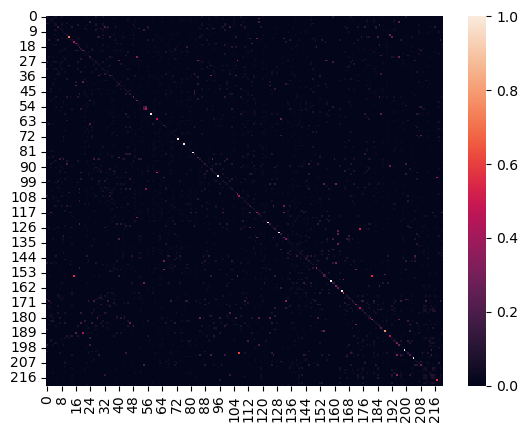

In [ ]:
sns.heatmap(temporal_att[1][0],vmax=1,vmin=0)

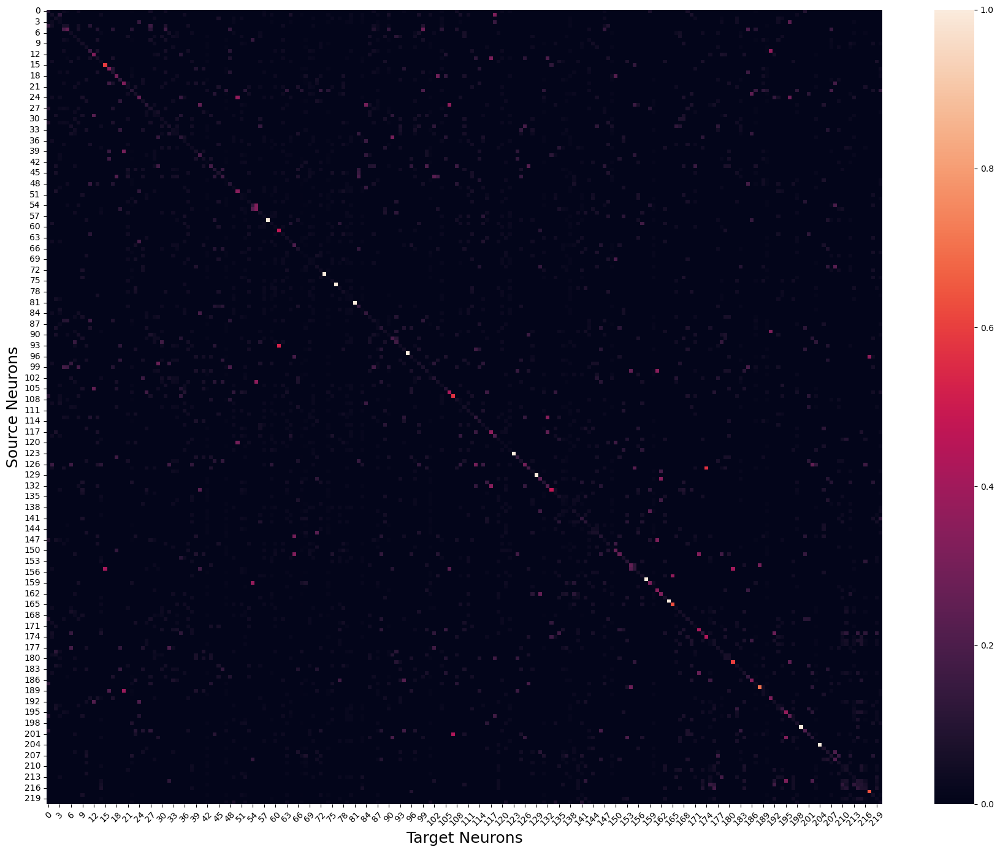

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np  # Assuming temporal_att[1][0] is a numpy array

# Generate a heatmap with enhancements
plt.figure(figsize=(20, 14))  # Adjust the size of the plot
sns.heatmap(
    temporal_att[3][0],  # Your data
    vmin=0, vmax=1,  # Value range
    #cbar_kws={'label': 'Attention Score','fontsize': 18},  # Add a label to the color bar

)

# Add a descriptive title and axis labels
#plt.title('Temporal Attention Heatmap', fontsize=25)
plt.xlabel('Target Neurons', fontsize=18)
plt.ylabel('Source Neurons', fontsize=18)

# Rotate the x-axis and y-axis labels if needed
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Display the heatmap
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to make space for color bar
plt.savefig(f"attn_heat_4.png", dpi=300, bbox_inches='tight', format='png')
plt.show()


<Axes: >

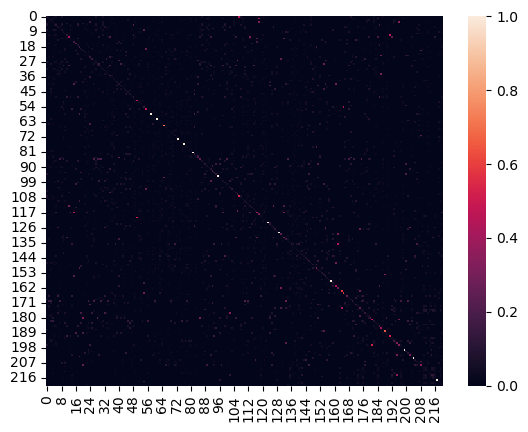

In [ ]:
sns.heatmap(temporal_att[1][0],vmax=1,vmin=0)

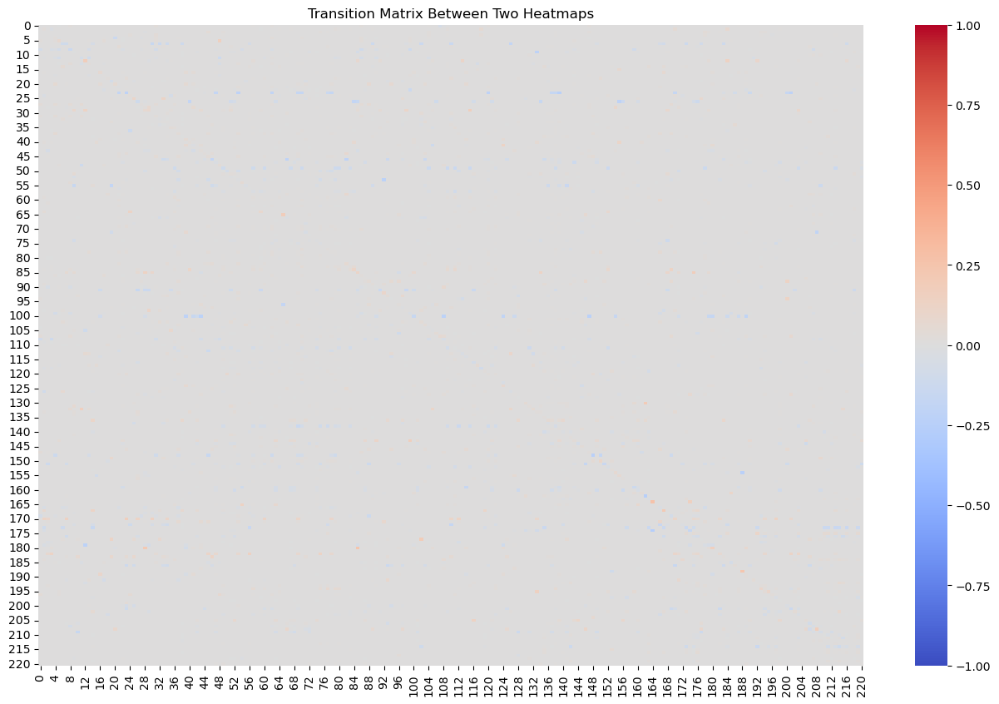

In [ ]:
transition_matrix = compute_transition(temporal_att[0][0],temporal_att[1][0])
"""
Blue (-1) represents removed connections,
Red (1) represents new connections,
White (0) indicates no change.

"""
# Plot the transition matrix
plt.figure(figsize=(16, 10))  # Set the figure size as needed
sns.heatmap(transition_matrix, cmap="coolwarm", annot=False, cbar=True, center=0, vmax=1, vmin=-1)
plt.title("Transition Matrix Between Two Heatmaps")
plt.show()

In [ ]:
temporal_att[0][0][0]

tensor([0.0707, 0.0000, 0.0000, 0.0000, 0.0529, 0.0414, 0.0000, 0.0000, 0.0540,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0150, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0685, 0.0000, 0.0000, 0.0000, 0.0262, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0088, 0.0000, 0.0000, 0.0000, 0.0000, 0.0142,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0405, 0.0000, 0.0000, 0.0000,
        0.0194, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0154, 0.0000, 0.0000, 0.5284,
        0.0747, 0.0000, 0.0000, 0.0000, 

In [ ]:
plt.figure(figsize=(18 ,14))  # Adjust the width and height as needed
sns.heatmap(mean_attn, vmax=1, vmin=0, cmap="rocket")  # You can add annot=True for values on the heatmap
plt.title("Attention Weights Heatmap")
plt.xlabel("Nodes")
plt.ylabel("Nodes")
plt.show()

NameError: name 'mean_attn' is not defined

<Figure size 1800x1400 with 0 Axes>

In [ ]:
edge_index_sets[0].T

NameError: name 'edge_index_sets' is not defined

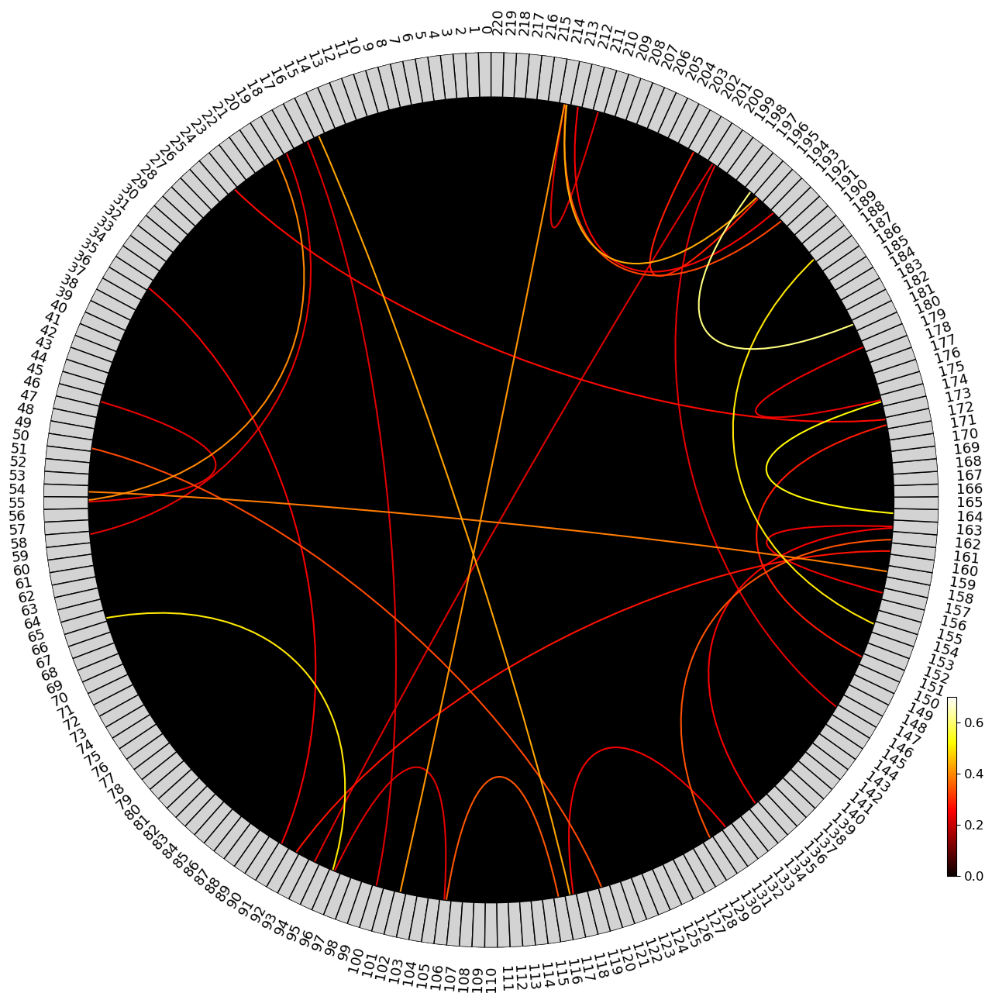

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mne.datasets import sample
from mne.minimum_norm import apply_inverse_epochs, read_inverse_operator
from mne.viz import circular_layout

from mne_connectivity import spectral_connectivity_epochs
from mne_connectivity.viz import plot_connectivity_circle
WIN = 4
# Assume temporal_matrix is your functional connectivity matrix (NxN)
temporal_matrix = temporal_att[WIN][0].detach().numpy()  # Replace with your actual matrix
threshold = 0.0
con_matrix = np.copy(temporal_matrix)
con_matrix[con_matrix < threshold] = 0  # Apply threshold to keep only strong connections

# Use indices as labels
label_names = [str(i) for i in range(len(temporal_matrix))]

# Generate circular layout
node_order = label_names  # No reordering needed since we're just using indices
node_angles = circular_layout(
    label_names, node_order, start_pos=90
)

# Define node colors (one color for simplicity or a list for distinct colors)
node_colors = ["lightgrey"] * len(label_names)  # Use "skyblue" for all nodes

# Plot the functional connectivity graph
fig, ax = plt.subplots(figsize=(20, 15), subplot_kw=dict(polar=True))
plot_connectivity_circle(
    con_matrix,
    label_names,
    n_lines=30,  # Number of strongest connections to show
    node_angles=node_angles,
    #title="Functional Connectivity Graph (Indices as Labels)",
    ax=ax,
    node_colors=node_colors,  # Corrected to be a list of colors
    facecolor="black",  # Background color
    textcolor="black", # Label color
    padding=0.0,
    fontsize_names=13,
    fontsize_colorbar=12,
    colorbar=True,  # Enable colorbar
    colorbar_size=0.2,  # Adjust size of colorbar
    vmin = 0,
    vmax= 0.7,
    node_linewidth =1.0

  
)
plt.tight_layout()
fig.savefig(f"attn_{WIN}.png", dpi=300, bbox_inches='tight', facecolor=fig.get_facecolor())
#plt.savefig(f"attn_{WIN}.png", dpi=300, bbox_inches='tight', format='png')
plt.show()



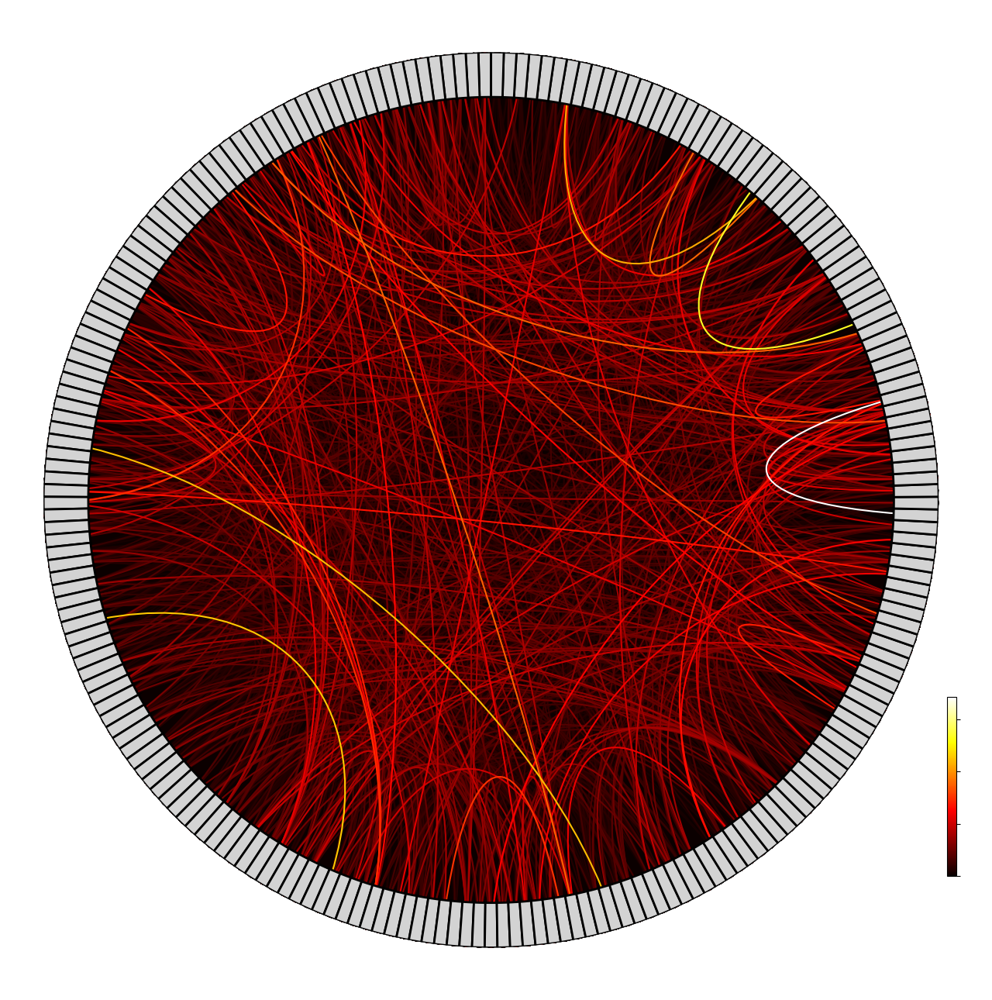

StopIteration: 

<Figure size 640x480 with 0 Axes>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mne.viz import circular_layout
from mne_connectivity.viz import plot_connectivity_circle

# Assume temporal_matrix is your functional connectivity matrix (NxN)
WIN = 0
temporal_matrix = temporal_att[WIN][0].detach().numpy()  # Replace with your actual matrix
threshold = 0.0
con_matrix = np.copy(temporal_matrix)
con_matrix[con_matrix < threshold] = 0  # Apply threshold to keep only strong connections

# Use indices as labels
label_names = [str(i) for i in range(len(temporal_matrix))]

# Generate circular layout
node_order = label_names  # No reordering needed since we're just using indices
node_angles = circular_layout(
    label_names, node_order, start_pos=90
)

# Define node colors (one color for simplicity or a list for distinct colors)
node_colors = ["lightgrey"] * len(label_names)  # Use "skyblue" for all nodes

# Plot the base connectivity graph
fig, ax = plt.subplots(figsize=(20, 15), subplot_kw=dict(polar=True))
plot_connectivity_circle(
    con_matrix,
    label_names,
    n_lines=0,  # Disable lines from this function, we'll draw them manually
    node_angles=node_angles,
    ax=ax,
    node_colors=node_colors,
    facecolor="black",
    textcolor="white",  # Node label color
    padding=0.0,
    fontsize_names=13,
    fontsize_colorbar=12,
    colorbar=True,
    colorbar_size=0.2,
)

# Add directed edges manually with arrows
for i in range(len(con_matrix)):
    for j in range(len(con_matrix)):
        if con_matrix[i, j] > 0:  # If there's a connection
            start_angle = np.deg2rad(node_angles[i])
            end_angle = np.deg2rad(node_angles[j])

            # Draw the arc with an arrow to indicate direction
            ax.annotate(
                "",
                xy=(np.cos(end_angle), np.sin(end_angle)),  # End point
                xytext=(np.cos(start_angle), np.sin(start_angle)),  # Start point
                arrowprops=dict(
                    arrowstyle="-|>",  # Arrow style
                    color="white",  # Arrow color
                    lw=1.5,  # Line width
                ),
            )

plt.tight_layout()
fig.savefig(f"attn_{WIN}_directed.png", dpi=300, bbox_inches="tight", facecolor=fig.get_facecolor())
plt.show()


In [ ]:
temporal_att[0][0].shape

torch.Size([221, 221])

In [ ]:
node_index = 174
top_n = 5

top_neighbors = model.gdn.get_top_neighbors(node_index, top_n=top_n,use_weighted=True)
print(f"Top {top_n} neighbors for node {node_index}:")
for neighbor, similarity in top_neighbors:
    print(f"Node {neighbor} with similarity {similarity:.4f}")

Top 5 neighbors for node 174:
Node 24 with similarity 0.4474
Node 52 with similarity 0.3005
Node 188 with similarity 0.2884
Node 140 with similarity 0.2779
Node 14 with similarity 0.2698


In [ ]:
plot_pairs(df_mts,[174,164])

/cluster/home/abasine/.conda/envs/myenv/lib/python3.9/site-packages/numpy/lib/function_base.py:520: RuntimeWarning:

Mean of empty slice.

/cluster/home/abasine/.conda/envs/myenv/lib/python3.9/site-packages/numpy/core/_methods.py:121: RuntimeWarning:

invalid value encountered in divide

/cluster/home/abasine/.conda/envs/myenv/lib/python3.9/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning:

Degrees of freedom <= 0 for slice

/cluster/home/abasine/.conda/envs/myenv/lib/python3.9/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning:

divide by zero encountered in divide

/cluster/home/abasine/.conda/envs/myenv/lib/python3.9/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning:

invalid value encountered in multiply



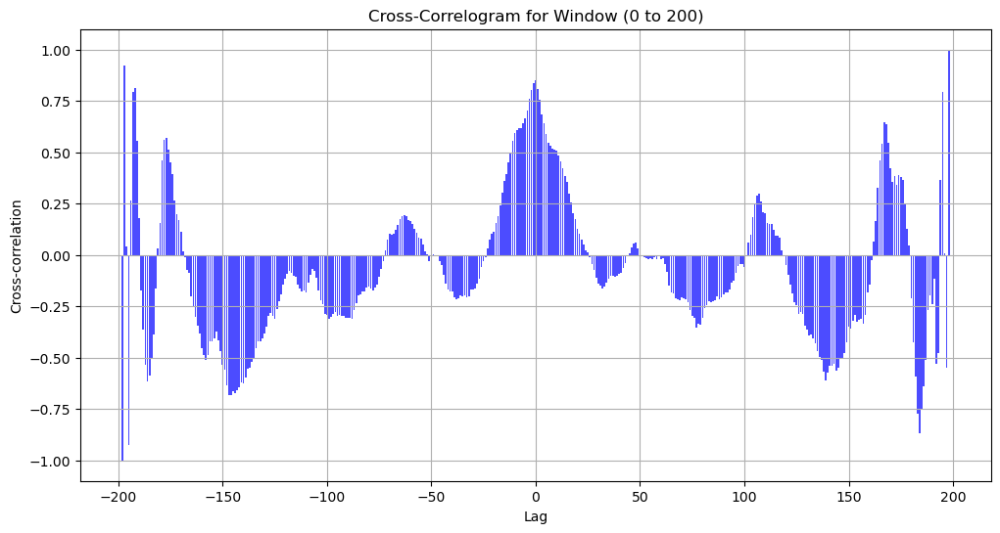

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def cross_correlation_in_window(col1, col2, window_start, window_end, max_lag=250):
    # Extract the window of data from both columns
    window_col1 = col1[window_start:window_end]
    window_col2 = col2[window_start:window_end]
    
    lags = np.arange(-max_lag, max_lag + 1)
    cross_corr_values = []

    for lag in lags:
        if lag < 0:
            # Negative lag: lag col1 behind col2
            cross_corr_values.append(np.corrcoef(window_col1[:lag], window_col2[-lag:])[0, 1])
        elif lag > 0:
            # Positive lag: lag col2 behind col1
            cross_corr_values.append(np.corrcoef(window_col1[lag:], window_col2[:-lag])[0, 1])
        else:
            # Zero lag: correlation without any shift
            cross_corr_values.append(np.corrcoef(window_col1, window_col2)[0, 1])
    
    return lags, cross_corr_values

# Select your columns (col1 and col2) from the dataframe `df_mts`
col1 = df_mts.iloc[:, 89]
col2 = df_mts.iloc[:, 56]

# Define the window range (you can change this based on your data)
window_start = 0  # Starting index of the window
window_end = 200   # Ending index of the window

# Compute cross-correlation values within the window
lags, cross_corr_values = cross_correlation_in_window(col1, col2, window_start, window_end)

# Plot the cross-correlogram for the selected window
plt.figure(figsize=(12, 6))
plt.bar(lags, cross_corr_values, color='b', alpha=0.7)
plt.xlabel('Lag')
plt.ylabel('Cross-correlation')
plt.title(f'Cross-Correlogram for Window ({window_start} to {window_end})')
plt.grid(True)
plt.show()


## Heatmap of top

## Correlation

In [ ]:
from sklearn.preprocessing import StandardScaler,RobustScaler

target_index = 0 
target_correlations = correlation_matrix.iloc[target_index]

#  Get the indices of the top 10 most similar time series (including self-correlation)
top_10_indices = target_correlations.nlargest(30).index
top_10_values = target_correlations.nlargest(30).values

print("Top 10 most similar time series indices (including self):", top_10_indices)
print("Top 10 correlation values (including self):", top_10_values)


Top 10 most similar time series indices (including self): Int64Index([  0,  27,  31, 107, 104,  62,  86,   4,   8, 182,  11, 193,  22,
             70, 194, 169,   5, 122,  75, 185, 201,  17, 187, 207,  13, 120,
             99,  79, 159,  23],
           dtype='int64')
Top 10 correlation values (including self): [1.         0.93517396 0.5800657  0.54839899 0.5266092  0.4999312
 0.49173352 0.48951963 0.45664483 0.45397858 0.44944555 0.42649104
 0.41944857 0.4127949  0.40522985 0.40110586 0.39883269 0.38899512
 0.38010715 0.37603062 0.36688335 0.36310278 0.36000281 0.3543919
 0.3531614  0.35250255 0.35190558 0.34777626 0.34633601 0.34531427]


In [ ]:
node_index = 0
top_n = 20

top_neighbors = model.get_top_neighbors(node_index, top_n=top_n,use_weighted=True)
print(f"Top {top_n} neighbors for node {node_index}:")
for neighbor, similarity in top_neighbors:
    print(f"Node {neighbor} with similarity {similarity:.4f}")

AttributeError: 'GDN_Dynamic' object has no attribute 'get_top_neighbors'

## T-Sne

In [ ]:
plot_node_embeddings_tsne_plotly(model.gdn, node_num=len(list(df_mts.columns)))

In [ ]:
from util.utils import *
plot_node_embeddings_tsne_thesis(model.gdn, node_num=len(list(df_mts.columns)))

In [ ]:

# Define the node index and number of neighbors
node_index = 32
top_n = 10

top_neighbors = model.gdn.get_top_neighbors(node_index, top_n=top_n, use_weighted=True)

print(f"Top {top_n} neighbors for node {node_index}:")
for neighbor, similarity in top_neighbors:
    print(f"Node {neighbor} with similarity {similarity:.4f}")

top10_neighbors = top_neighbors[:top_n]

# Extract coordinates from df_positions
x_all, y_all, z_all = df_mts_pos['x'], df_mts_pos['y'], df_mts_pos['z']
x_node, y_node, z_node = x_all.iloc[node_index], y_all.iloc[node_index], z_all.iloc[node_index]

# Coordinates and indices for the top 10 neighbors
top10_indices = [neighbor[0] for neighbor in top10_neighbors]
x_top10, y_top10, z_top10 = df_mts_pos.iloc[top10_indices]['x'], df_mts_pos.iloc[top10_indices]['y'], df_mts_pos.iloc[top10_indices]['z']
text_labels = [f'Node {idx}' for idx in top10_indices]  

# Plot with Plotly
fig = go.Figure()

# Plot all nodes as light grey
fig.add_trace(go.Scatter3d(x=x_all, y=y_all, z=z_all, mode='markers',
                           marker=dict(size=4, color='lightgrey', opacity=0.5),
                           name='All Nodes'))

# Highlight the specific node
fig.add_trace(go.Scatter3d(x=[x_node], y=[y_node], z=[z_node], mode='markers',
                           marker=dict(size=8, color='red', opacity=1),
                           name=f'Node {node_index}'))

# Plot the top 10 neighbors in blue with text labels
fig.add_trace(go.Scatter3d(x=x_top10, y=y_top10, z=z_top10, mode='markers+text',
                           marker=dict(size=6, color='blue', opacity=0.8),
                           text=text_labels,
                           textposition="top center",
                           name='Top 10 Neighbors'))

# Update layout for clarity
fig.update_layout(scene=dict(
    xaxis_title='X Position',
    yaxis_title='Y Position',
    zaxis_title='Z Position'
),
    title=f'Node {node_index} and its Top 10 Neighbors in 3D Space'
)

fig.show()
